### Analyze csv data

In [203]:
import pandas as pd
import matplotlib.pyplot as plt
import contextily as cx
import geopandas as gpd
import requests
import numpy as np
import math
import gc
import json
import re
import keplergl as kp
import glob
import os
import ast
import seaborn as sns

from pymeos import *
from tqdm.notebook import tqdm
from shapely.geometry import LineString, Point
from sklearn import metrics
from scipy import stats
from ast import literal_eval
from geopy.distance import geodesic
from itertools import groupby
from operator import itemgetter

from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, KFold, cross_validate, GridSearchCV, cross_val_score, GroupShuffleSplit
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler

SIGNALS = ['lastDayTotalConsumedEnergy']
from shapely import wkt, get_srid, set_srid
tqdm.pandas()
pymeos_initialize()

In [204]:
%matplotlib inline
sns.set(rc = {'figure.figsize': (8,5)})

In [205]:
pd.set_option('display.precision', 1)

### Importing the data

In [206]:
dataset = pd.read_csv('../processed_data/dataset_cleaned_v5.csv')
dataset['t'] = pd.to_datetime(dataset['t'])
dataset['date'] = dataset['t'].dt.date
dataset['vehicle'] = dataset['vehicle'].astype(str)
dataset['road_segment_id'] = dataset['road_segment_id'].astype(str)
dataset = dataset.drop(columns=['segment_id', 'snowfall', 'est_segment_battery_consumption(kwh)', 'sunshine_duration', 'rain', 'soil_moisture_0_to_7cm', 'soil_temperature_0_to_7cm', 'datetime', 'speed_meos'])

In [207]:
dataset['stop'] = dataset['trip_id'].str.contains('stop')
    # Create a new unique trip identifier
dataset['unique_trip_id'] = dataset['vehicle'].astype(str) + '_' + dataset['date'].astype(str) + '_' + dataset['trip_id'].astype(str)
dataset = dataset.drop(columns=['trip_id'])

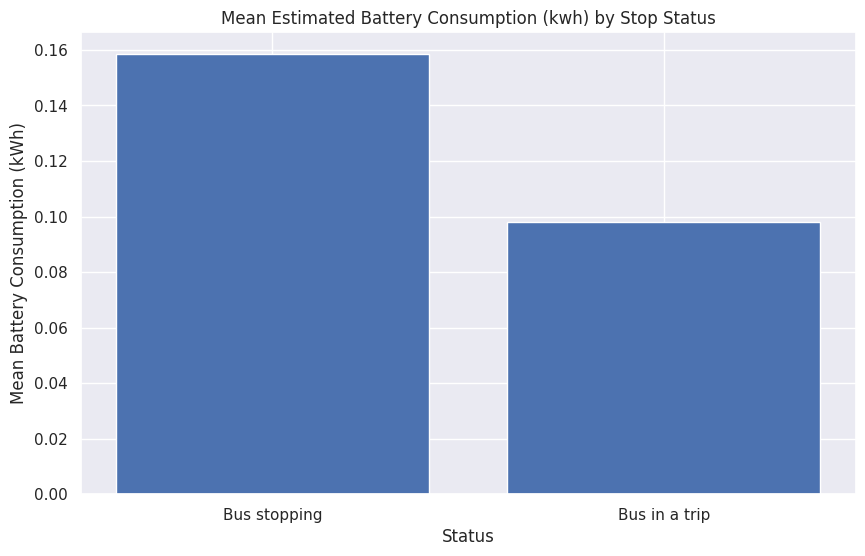

In [208]:
# Calculate the mean battery consumption for both statuses
mean_consumption_stop = dataset[dataset['stop']]['est_battery_consumption(kwh)'].mean()
mean_consumption_not_stop = dataset[~dataset['stop']]['est_battery_consumption(kwh)'].mean()

# Prepare data for plotting
mean_consumptions = {
    'Bus stopping': mean_consumption_stop,
    'Bus in a trip': mean_consumption_not_stop
}

# Plot the data
plt.figure(figsize=(10, 6))
plt.bar(mean_consumptions.keys(), mean_consumptions.values())
plt.xlabel('Status')
plt.ylabel('Mean Battery Consumption (kWh)')
plt.title('Mean Estimated Battery Consumption (kwh) by Stop Status')
plt.show()


In [209]:
dt = dataset.groupby(['vehicle', 'date'])['est_battery_consumption(kwh)'].sum().reset_index()
battery_df = pd.concat(map(pd.read_csv, glob.glob(os.path.join('../data', "*.csv"))))
battery_df = battery_df.rename(columns={'Segnale': 'signal', 'Valore': 'value', 'DataOra': 't', 'Latitudine': 'latitude', 'Veicolo': 'vehicle', 'Longitudine': 'longitude'})
battery_df = battery_df[(battery_df["longitude"] >= 5.93) & (battery_df["longitude"] <= 18.99)]
battery_df = battery_df[(battery_df["latitude"] >= 34.76) & (battery_df["latitude"] <= 47.1)]

consumption_df = battery_df[battery_df['signal'] == 'lastDayTotalConsumedEnergy']
consumption_df['t'] = pd.to_datetime(consumption_df['t'])
consumption_df['date'] = consumption_df['t'].dt.date
consumption_df = consumption_df.sort_values(by=['vehicle', 't'])
consumption_df
# gt = consumption_df.groupby(['vehicle', 'date'])['value'].last().reset_index()

# pd.merge(dt, gt, on=['vehicle', 'date'])

/tmp/ipykernel_36298/330339287.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  consumption_df['t'] = pd.to_datetime(consumption_df['t'])
/tmp/ipykernel_36298/330339287.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  consumption_df['date'] = consumption_df['t'].dt.date


,vehicle,t,signal,value,latitude,longitude,date
2164,E301,2024-01-21 08:16:26,lastDayTotalConsumedEnergy,0.0,44.4,8.9,2024-01-21
2165,E301,2024-01-21 08:18:27,lastDayTotalConsumedEnergy,0.0,44.4,8.9,2024-01-21
2166,E301,2024-01-21 08:18:58,lastDayTotalConsumedEnergy,0.0,44.4,8.9,2024-01-21
2167,E301,2024-01-21 08:19:28,lastDayTotalConsumedEnergy,0.0,44.4,8.9,2024-01-21
2168,E301,2024-01-21 08:40:40,lastDayTotalConsumedEnergy,0.0,44.4,8.9,2024-01-21
...,...,...,...,...,...,...,...
43752,E316,2024-02-09 21:02:04,lastDayTotalConsumedEnergy,163.0,44.4,8.9,2024-02-09
43753,E316,2024-02-09 21:02:35,lastDayTotalConsumedEnergy,163.0,44.4,8.9,2024-02-09
43754,E316,2024-02-09 21:03:06,lastDayTotalConsumedEnergy,163.0,44.4,8.9,2024-02-09
43755,E316,2024-02-09 21:03:36,lastDayTotalConsumedEnergy,163.0,44.4,8.9,2024-02-09


In [210]:
dataset.dtypes

vehicle                                 object
t                               datetime64[ns]
road_segment_id                         object
est_battery_consumption(kwh)           float64
date                                    object
segment_length                         float64
distance_traveled                      float64
temperature_2m                         float64
relative_humidity_2m                   float64
precipitation                          float64
wind_speed_10m                         float64
wind_direction_10m                     float64
is_day                                 float64
mean_elevation                         float64
avg_grade                              float64
avg_angle                              float64
geometry                                object
stop                                      bool
unique_trip_id                          object
dtype: object

### Visualize the data

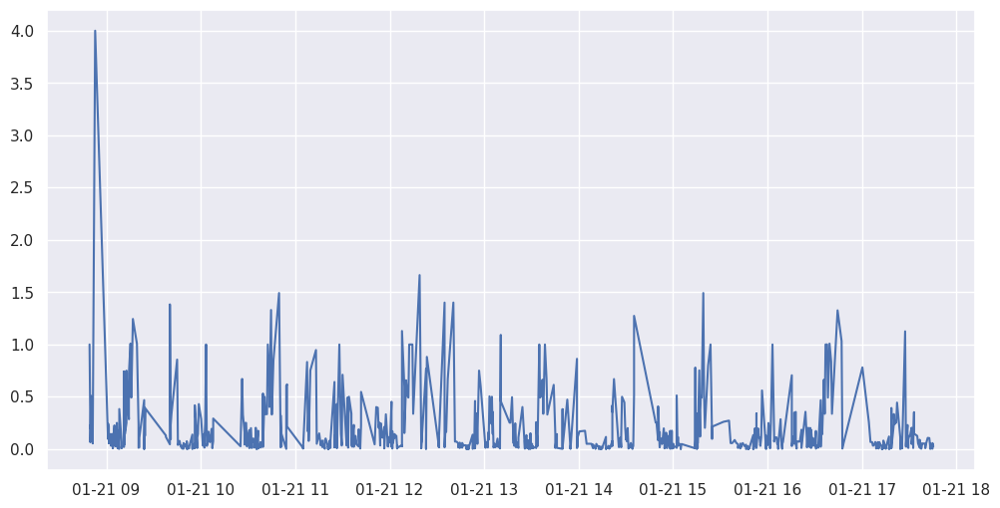

In [211]:
def visualize_over_time(attribute, vehicle, date):
    # Filter DataFrame
    df = dataset[(dataset['vehicle'] == vehicle) & (dataset['date'] == date)]

    plt.figure(figsize=(12, 6))
    plt.plot(df['t'], df[attribute], linestyle='-')
    plt.xlabel('')
    plt.ylabel('')
    plt.title('')
    plt.grid(True)
    plt.show()

visualize_over_time('est_battery_consumption(kwh)', 'E301', pd.to_datetime('2024-01-21').date())

### Exploring the data

In [124]:
dataset.shape

(264998, 19)

In [339]:
dataset.isna().sum()

vehicle                         0
t                               0
road_segment_id                 0
est_battery_consumption(kwh)    0
date                            0
segment_length                  0
distance_traveled               0
trip_id                         0
temperature_2m                  0
relative_humidity_2m            0
precipitation                   0
wind_speed_10m                  0
wind_direction_10m              0
is_day                          0
mean_elevation                  0
avg_grade                       0
avg_angle                       0
geometry                        0
stop                            0
rain_status                     0
day_of_week                     0
is_weekend                      0
time_range                      0
duration                        0
dtype: int64

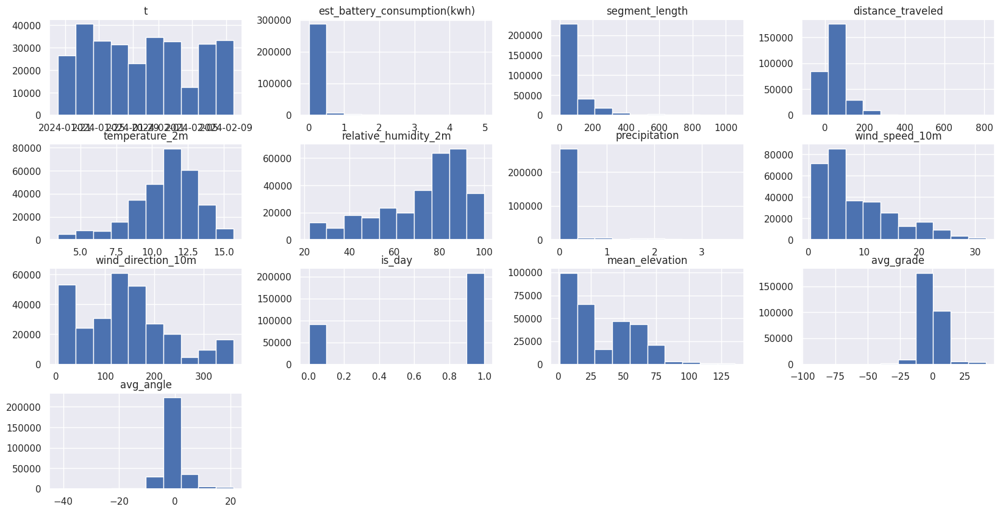

In [10]:
dataset.hist(figsize=(20,10))
plt.show()

#### Check distribution of target prediction

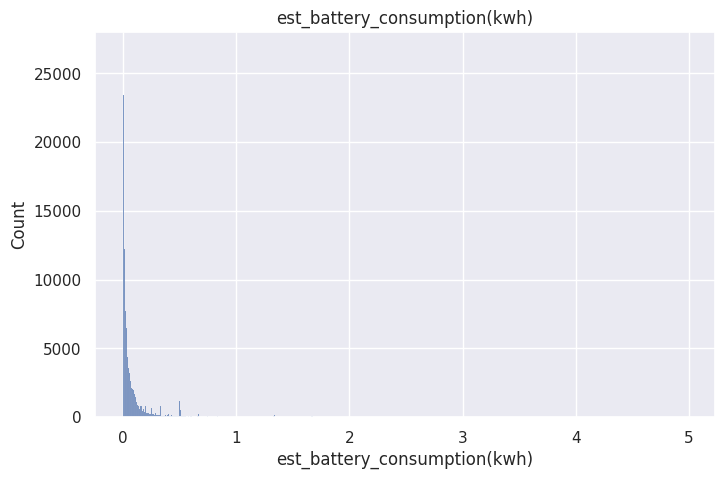

In [11]:
# counting the tuples corresponding to the different danceability values
sns.histplot(dataset['est_battery_consumption(kwh)'])
plt.title('est_battery_consumption(kwh)')
plt.show()

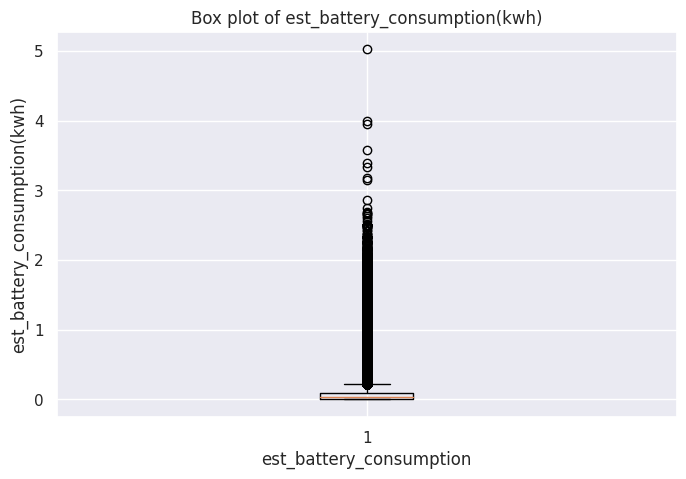

In [19]:
# # Turn off interactive mode
plt.ioff()

# Create box plots for each column
for column in ['est_battery_consumption(kwh)']:
    # Create a list of data for each group
    data = dataset[column]
    
    # Create a figure and axis for the box plot
    fig, ax = plt.subplots(figsize=(8, 5))
    
    # Create the box plot
    ax.boxplot(data)
    
    # Set the title and labels
    ax.set_title(f'Box plot of {column}')
    ax.set_xlabel('est_battery_consumption')
    ax.set_ylabel(column)

    
# Show the plot
plt.show()

/tmp/ipykernel_11021/4083333902.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8, 5))


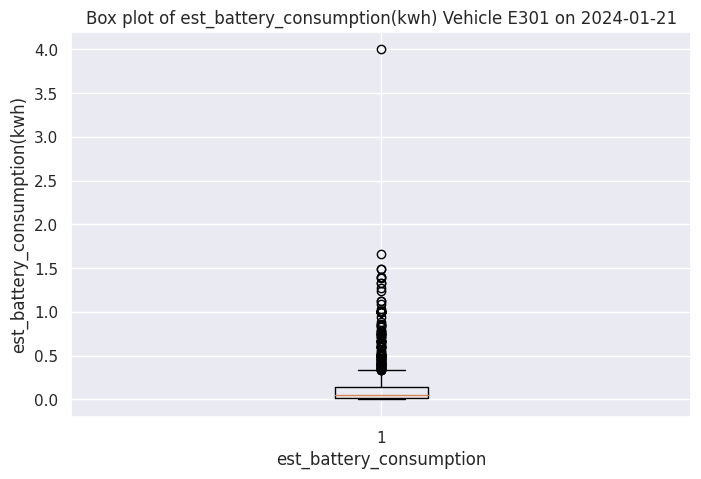

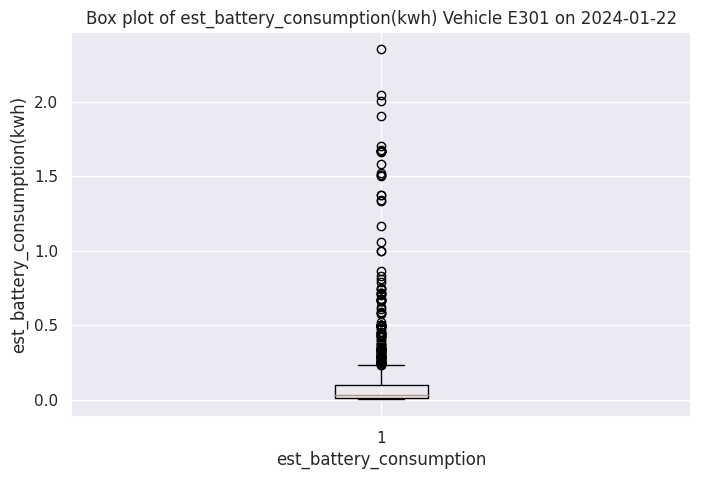

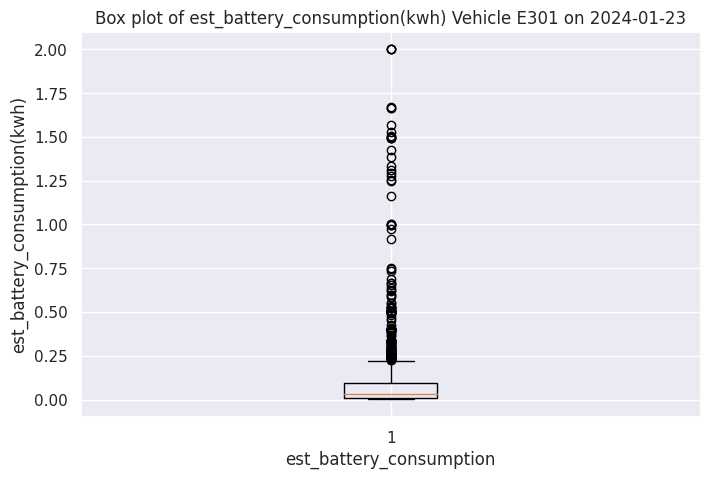

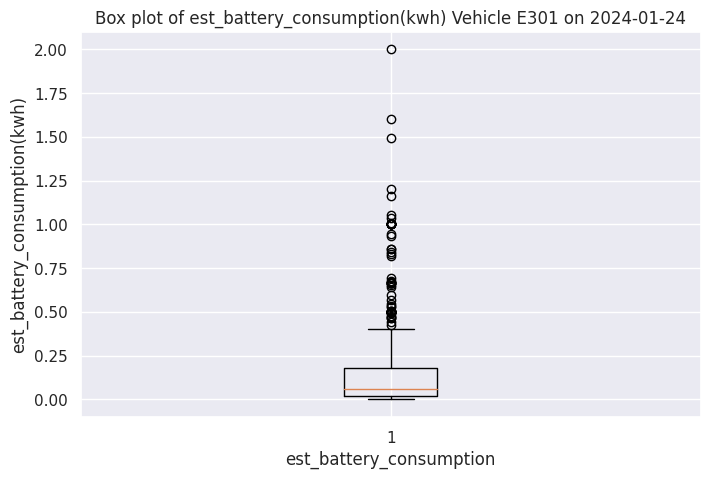

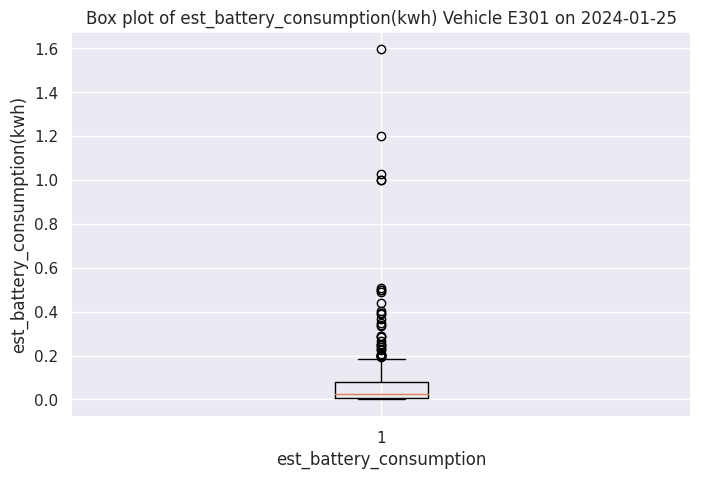

...

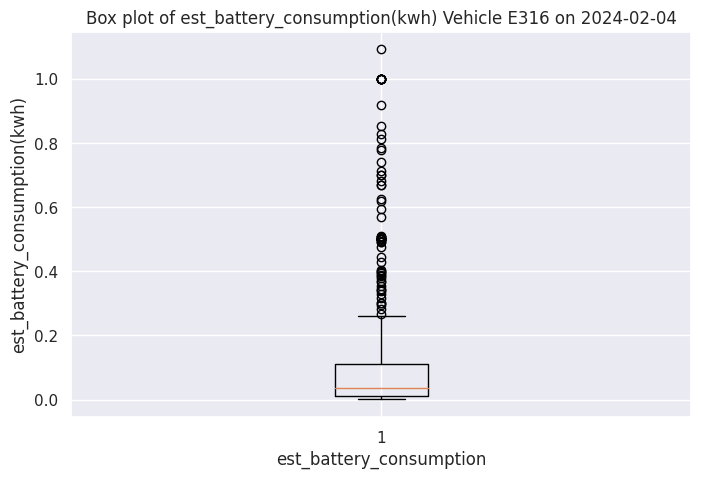

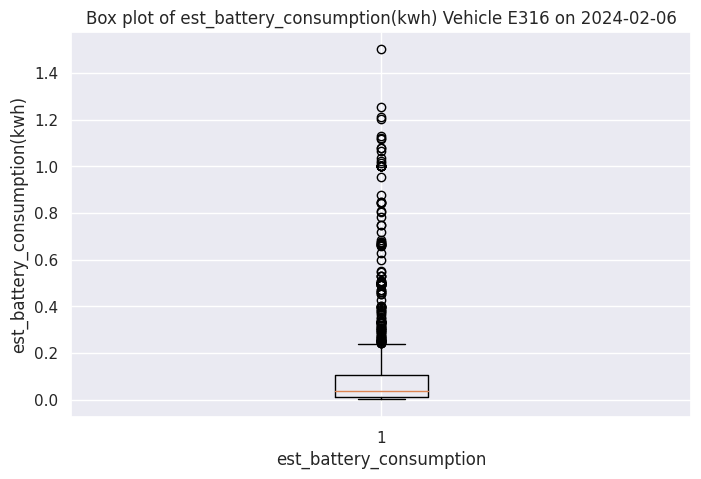

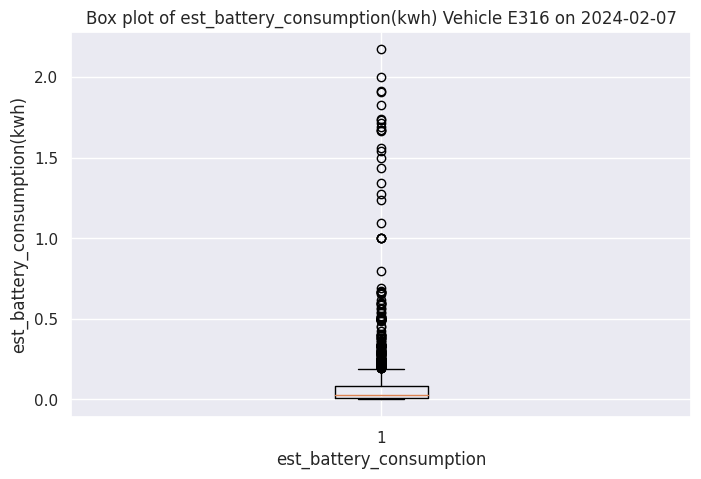

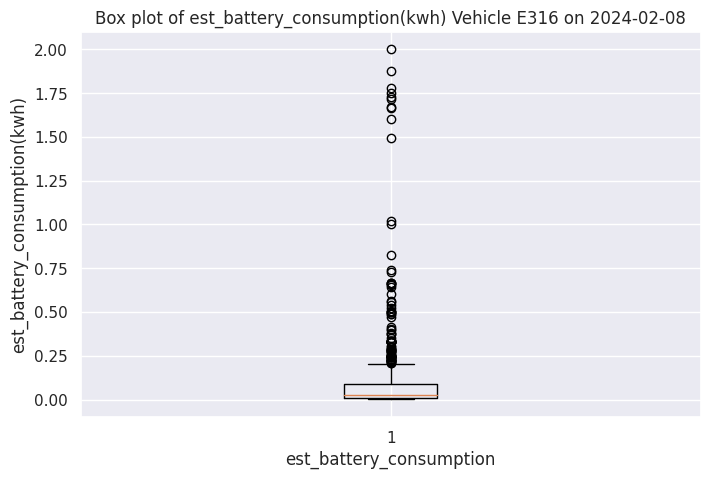

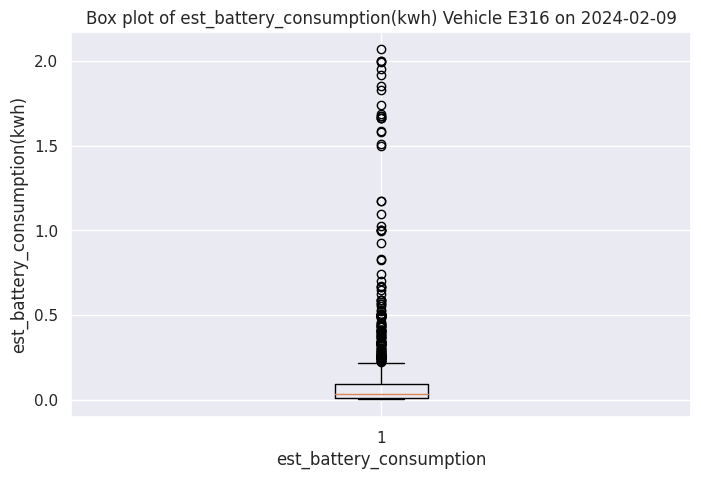

In [11]:
# # Turn off interactive mode
plt.ioff()

# Create box plots for each column
for column in ['est_battery_consumption(kwh)']:
    
    for name, group in dataset.groupby(['vehicle', 'date']):
        # Create a list of data for each group
        data = group[column]

        # Create a figure and axis for the box plot
        fig, ax = plt.subplots(figsize=(8, 5))

        # Create the box plot
        ax.boxplot(data)

        # Set the title and labels
        ax.set_title(f'Box plot of {column} Vehicle {name[0]} on {name[1]}')
        ax.set_xlabel('est_battery_consumption')
        ax.set_ylabel(column)

# Show the plot
plt.show()

#### Analyzing features - Raining vs non raining

In [16]:
rain_mean = dataset[dataset['precipitation'] > 0]['est_battery_consumption(kwh)'].mean()
non_raining_mean = dataset[dataset['precipitation'] == 0]['est_battery_consumption(kwh)'].mean()

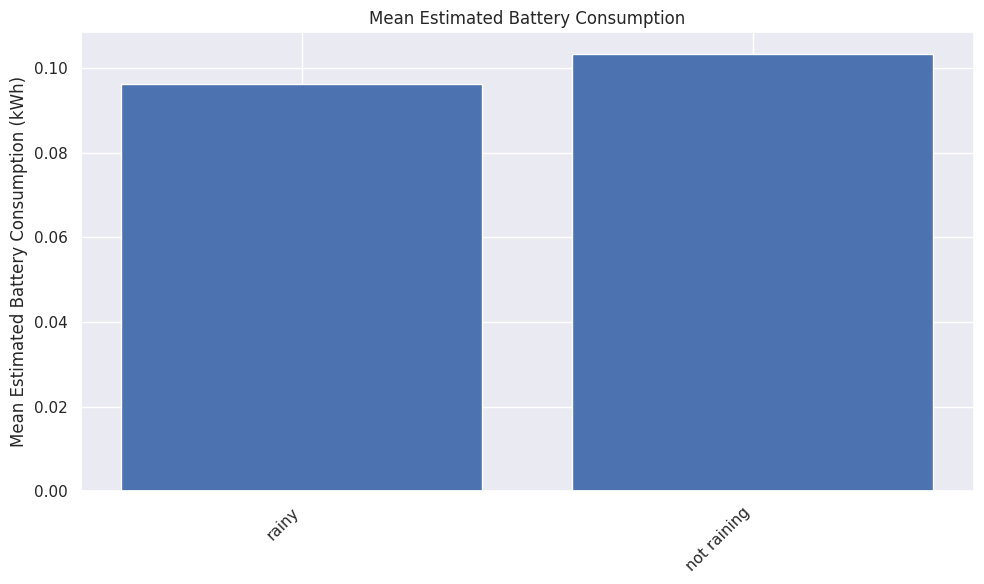

In [213]:
def plot_agg_consumption(means, labels, mode='Mean', name='Default'):
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.bar(labels, means)
    plt.ylabel(f'{mode} Estimated Battery Consumption (kWh)')
    plt.title(f'{mode} Estimated Battery Consumption')
    
    
    # Rotate the x-axis labels and adjust their alignment
    plt.xticks(rotation=45, ha='right')  # Rotate labels 45 degrees and align to the right
    plt.tight_layout()
    plt.savefig(f'{name}.png', format='png')
    plt.show()
    
def plot_scatter_with_line(consumption_values, rain_status_values, title):
    plt.figure(figsize=(10, 6))  # Larger figure size for better readability
    
    # Create a DataFrame for easier plotting with Seaborn
    df = pd.DataFrame({
        'Rain Status': rain_status_values,
        'Mean Estimated Battery Consumption (kWh)': consumption_values
    })
    
    # Sort the data by 'Rain Status' to ensure correct line plotting
    df.sort_values('Rain Status', inplace=True)
    
#     # Line plot using Seaborn to highlight the trend
#     sns.lineplot(
#         x='Rain Status', 
#         y='Mean Estimated Battery Consumption (kWh)', 
#         data=df, 
#         markers=True,  # Add markers on the line
#         dashes=False,  # Disable dashed line style
#         linewidth=1.5,  # Line width
#         label='Trend Line'  # Label for the legend
#     )
    
    # Scatter plot using Seaborn with larger markers
    sns.scatterplot(
        x='Rain Status', 
        y='Mean Estimated Battery Consumption (kWh)', 
        data=df, 
        s=600,  # Increase the size of the markers
        palette='viridis', 
        hue='Rain Status', 
        style='Rain Status',
        legend=True  # Disable legend for scatter plot to avoid duplication
    )
    
    plt.xlabel('', fontsize=18)
    plt.ylabel('Mean Consumption (kWh)', fontsize=18)
    plt.title(f'', fontsize=18)
    plt.xticks([])
    plt.yticks(fontsize=18)
    plt.tight_layout()
    plt.legend(title='Rain Status', fontsize=18, title_fontsize=18)
    plt.savefig(f'{title}.png', format='png')
    plt.show()


rain_mean = dataset[dataset['precipitation'] > 0]['est_battery_consumption(kwh)'].mean()
non_raining_mean = dataset[dataset['precipitation'] == 0]['est_battery_consumption(kwh)'].mean()
plot_agg_consumption([rain_mean, non_raining_mean], ['rainy', 'not raining'])

#### Categorize based on precipiration

In [212]:
# Vectorized application using np.select for efficiency
conditions = [
    (dataset['precipitation'] == 0),
    (dataset['precipitation'] > 0) & (dataset['precipitation'] < 2.5),
    (dataset['precipitation'] >= 2.5) & (dataset['precipitation'] <= 7.6),
    (dataset['precipitation'] > 7.6) & (dataset['precipitation'] <= 50),
    (dataset['precipitation'] > 50)
]

choices = ['No rain', 'Light rain', 'Moderate rain', 'Heavy rain', 'Violent rain']

dataset['rain_status'] = np.select(conditions, choices, default='Unknown')

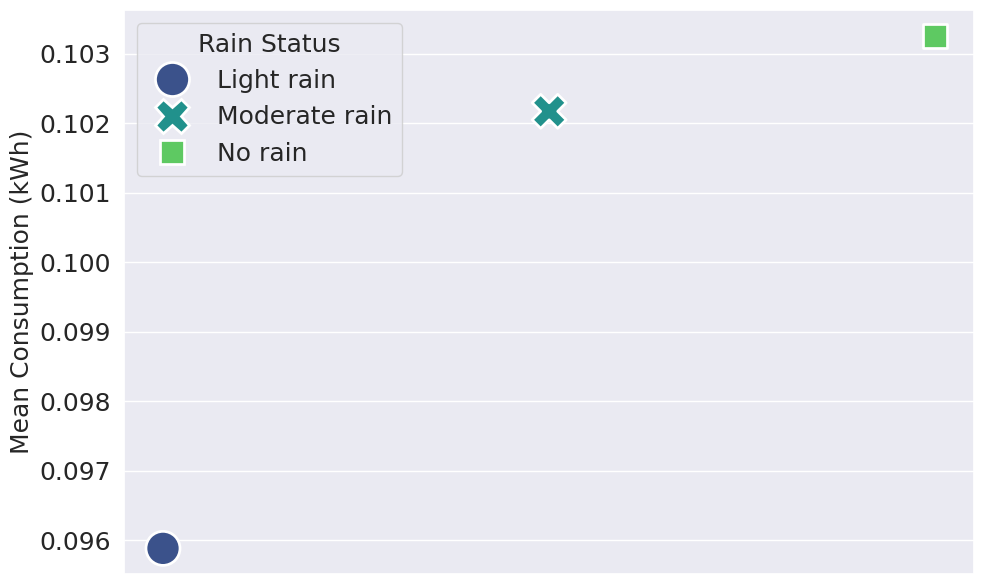

In [214]:
rain_status = dataset.groupby('rain_status')['est_battery_consumption(kwh)'].mean().reset_index()
plot_scatter_with_line(rain_status['est_battery_consumption(kwh)'].values, rain_status['rain_status'].values, 'Mean')

#### Analyzing based on the time of the day

In [67]:
def plot_agg_consumption_line(means, labels, mode='Mean', name='Default'):
    # Convert data to DataFrame for seaborn
    data = pd.DataFrame({'Labels': labels, 'Means': means})
    data['Labels']
    
    
    if name == "Day_of_week":
        # Define the order for the days of the week
        day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

        # Convert 'Labels' to a categorical type with the specified order
        data['Labels'] = pd.Categorical(data['Labels'], categories=day_order, ordered=True)

        # Sort the data by 'Labels'
        data = data.sort_values('Labels')

    # Plotting
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=data, x='Labels', y='Means', marker='o')

    plt.xlabel('')
    plt.ylabel('Mean Consumption (kWh)', fontsize=18)
    plt.title(f'')
    
    
    # Get the current tick locations and labels
    current_ticks = range(len(data['Labels']))  # Ensure ticks match the data indices
    current_labels = data['Labels']

    # Selectively display labels, e.g., every other label
#     skip = 4  # Change this value to control how many labels to skip
#     new_labels = [label if (i % skip == 0) and (i != 0) else None for i, label in enumerate(current_labels)]
    
# #     Apply new tick labels
#     plt.gca().set_xticklabels(new_labels)

    # Rotate the x-axis labels and adjust their alignment
    plt.xticks(rotation=45, ha='right', fontsize=18)  # Rotate labels 45 degrees and align to the right
    plt.yticks(fontsize=18)
    plt.tight_layout()
    plt.savefig(f'{name}.png', format='png')
    plt.show()

In [174]:
# Create a column for day of the week
dataset['day_of_week'] = dataset['t'].dt.day_name()

# Create a column for whether it is a weekend
dataset['is_weekend'] = dataset['t'].dt.dayofweek >= 5

# Define time bins
# Define hourly time bins
bins = list(range(0, 24*60+1, 60))  # bins every hour
labels = [f'{str(i).zfill(2)}:00-{str(i+1).zfill(2)}:00' for i in range(24)]

# Create a column for time range
dataset['time_range'] = pd.cut(dataset['t'].dt.hour*60 + dataset['t'].dt.minute, 
                               bins=bins, 
                               labels=labels, 
                               right=False, 
                               include_lowest=True)

In [40]:
dataset[['t', 'day_of_week', 'is_weekend', 'time_range']]

,t,day_of_week,is_weekend,time_range
0,2024-01-21 08:49:19,Sunday,True,08:00-09:00
1,2024-01-21 08:49:49,Sunday,True,08:00-09:00
2,2024-01-21 08:49:49,Sunday,True,08:00-09:00
3,2024-01-21 08:49:49,Sunday,True,08:00-09:00
4,2024-01-21 08:50:19,Sunday,True,08:00-09:00
...,...,...,...,...
264993,2024-02-09 20:59:31,Friday,False,20:00-21:00
264994,2024-02-09 21:00:01,Friday,False,21:00-22:00
264995,2024-02-09 21:01:03,Friday,False,21:00-22:00
264996,2024-02-09 21:01:03,Friday,False,21:00-22:00


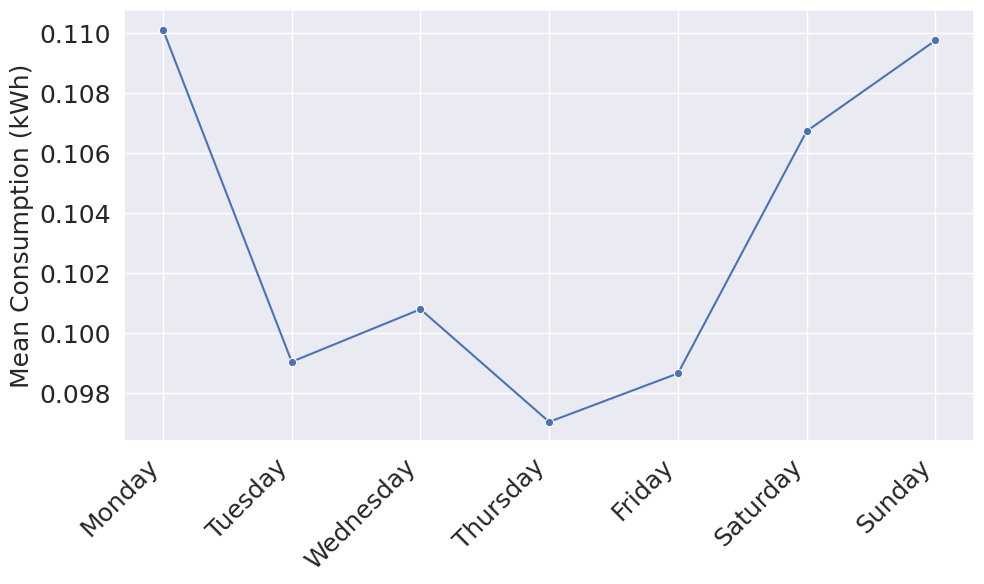

In [68]:
day_of_week = dataset.groupby(['day_of_week'])['est_battery_consumption(kwh)'].mean().reset_index()
plot_agg_consumption_line(day_of_week['est_battery_consumption(kwh)'].values, day_of_week['day_of_week'].values, name='Day_of_week')

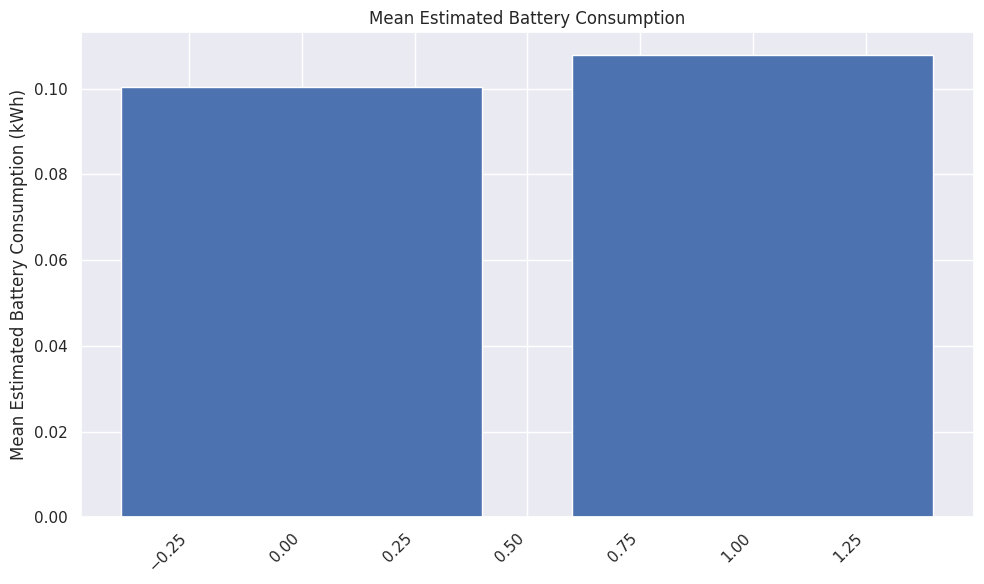

In [58]:
is_weekend = dataset.groupby('is_weekend')['est_battery_consumption(kwh)'].mean().reset_index()
plot_agg_consumption(is_weekend['est_battery_consumption(kwh)'].values, is_weekend['is_weekend'].values)

/tmp/ipykernel_36298/2877453133.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  time_range = dataset.groupby(['time_range'])['est_battery_consumption(kwh)'].mean().reset_index()
/tmp/ipykernel_36298/1484984338.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(new_labels)


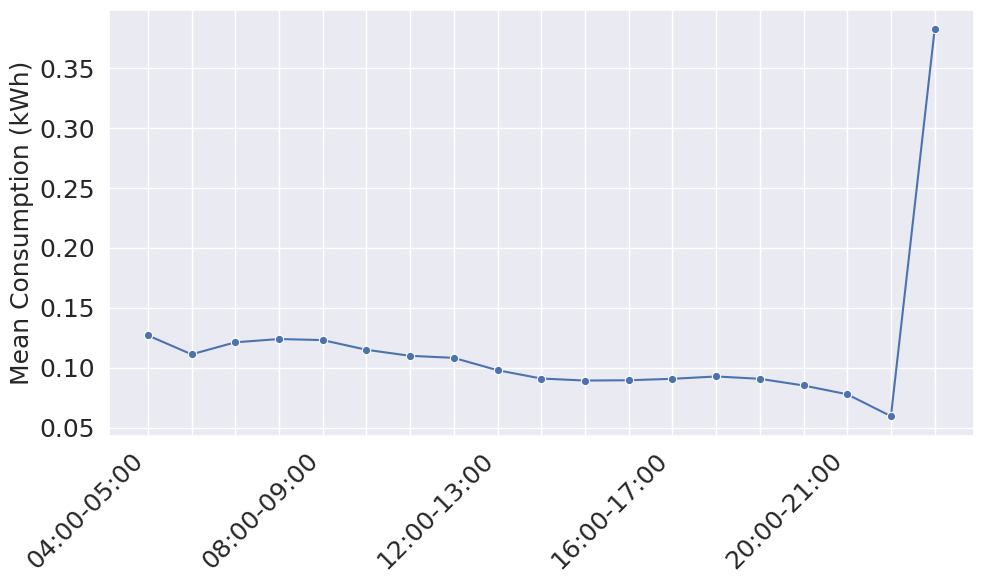

In [65]:
time_range = dataset.groupby(['time_range'])['est_battery_consumption(kwh)'].mean().reset_index()
plot_agg_consumption_line(time_range['est_battery_consumption(kwh)'].values, time_range['time_range'].values, name='Time_range')

/tmp/ipykernel_97818/2874433843.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_data = data.groupby(f'{attr}_bin')['est_battery_consumption(kwh)'].mean().reset_index()


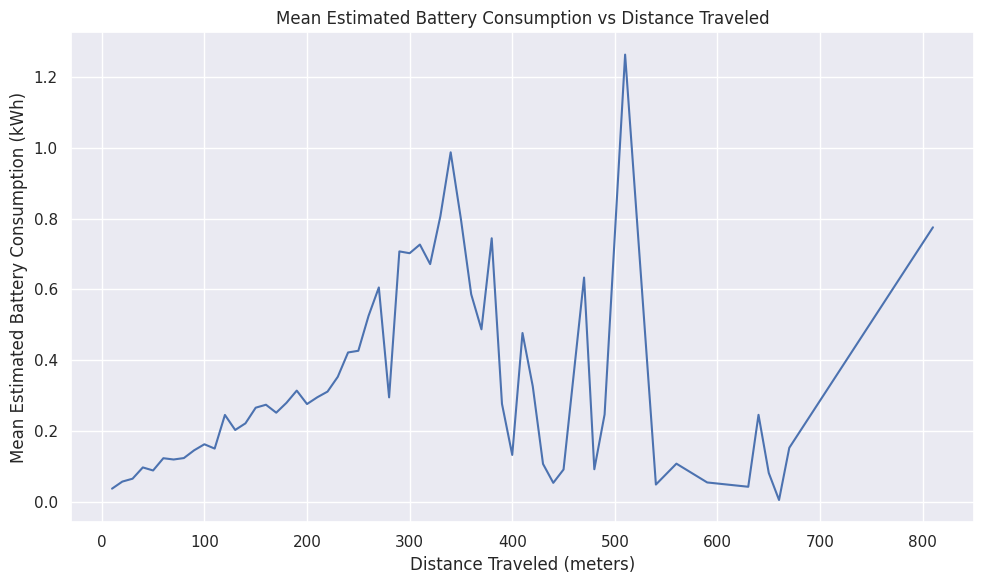

In [382]:
def plot_distance_vs_consumption(data, attr='distance_traveled', mode='Mean', name='Default'):
    # Convert data to DataFrame for seaborn
    # Bin the distances every 100 meters
    bins = range(0, int(max(data[attr])) + 10, 10)
    data[f'{attr}_bin'] = pd.cut(data[attr], bins, right=False)

    # Calculate mean consumption for each bin
    binned_data = data.groupby(f'{attr}_bin')['est_battery_consumption(kwh)'].mean().reset_index()

    # Extract bin labels for plotting
    binned_data[attr] = binned_data[f'{attr}_bin'].apply(lambda x: x.left + 10)  # Center of the bin

    # Plotting
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=binned_data, x=attr, y='est_battery_consumption(kwh)')

    plt.xlabel(f'{attr.replace("_", " ").title()} (meters)')
    plt.ylabel(f'{mode} Estimated Battery Consumption (kWh)')
    plt.title(f'{mode} Estimated Battery Consumption vs {attr.replace("_", " ").title()}')

    # Tight layout for better spacing
    plt.tight_layout()
    plt.savefig(f'{name}.png', format='png')
    plt.show()
    
plot_distance_vs_consumption(dataset, name='distance_traveled')

/tmp/ipykernel_97818/2874433843.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_data = data.groupby(f'{attr}_bin')['est_battery_consumption(kwh)'].mean().reset_index()


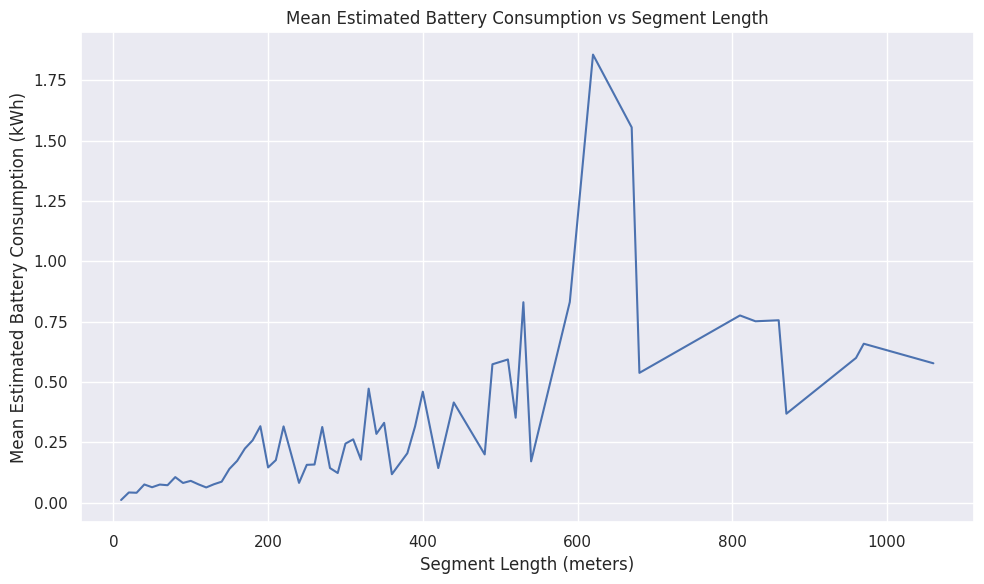

In [383]:
plot_distance_vs_consumption(dataset, attr='segment_length', name='segment_length')

In [ ]:
# Convert data to DataFrame for seaborn
# Convert data to DataFrame for seaborn
calc = dataset[~dataset['stop']]

# Bin the distances every 100 meters
bins = range(0, int(max(calc['speed_meos'])) + 1, 1)
calc['speed_meos_bin'] = pd.cut(calc['speed_meos'], bins, right=False)

# Calculate mean consumption for each bin
binned_data = calc.groupby('speed_meos_bin')['est_battery_consumption(kwh)'].mean().reset_index()

# Extract bin labels for plotting
binned_data['speed'] = binned_data['speed_meos_bin'].apply(lambda x: x.left + 1)  # Center of the bin

# Plotting
plt.figure(figsize=(10, 6))
sns.lineplot(data=binned_data, x='speed', y='est_battery_consumption(kwh)')

plt.xlabel(f'Speed (m/s)')
plt.ylabel(f'Mean Estimated Battery Consumption (kWh)')
plt.title(f'Mean Estimated Battery Consumption vs Speed')

# Tight layout for better spacing
plt.tight_layout()
plt.savefig(f'speed.png', format='png')
plt.show()

/tmp/ipykernel_36298/3206138973.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  calc['temperature_2m_bin'] = pd.cut(calc['temperature_2m'], bins, right=False)
/tmp/ipykernel_36298/3206138973.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_data = calc.groupby('temperature_2m_bin')['est_battery_consumption(kwh)'].mean().reset_index()


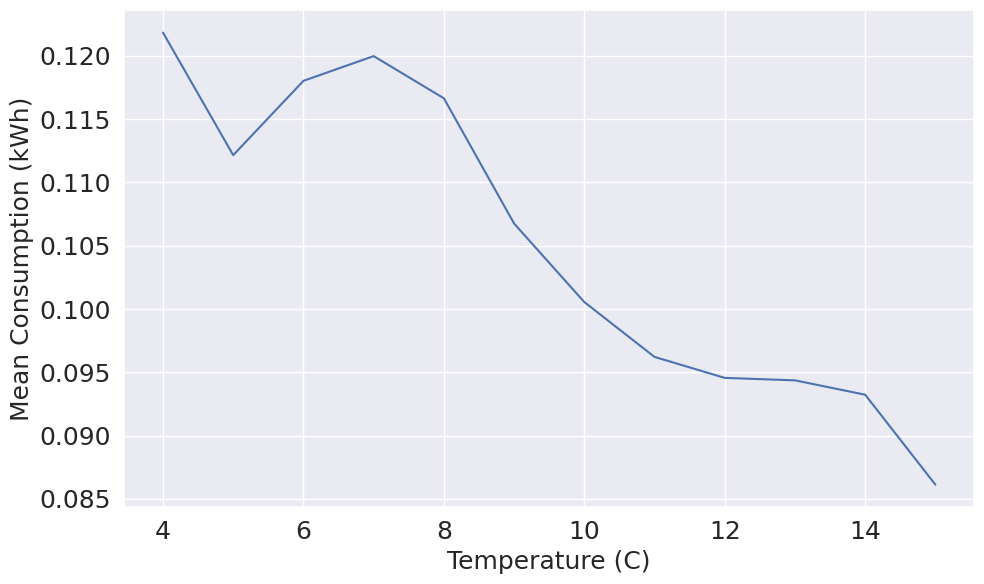

In [215]:
# Convert data to DataFrame for seaborn
# Convert data to DataFrame for seaborn
calc = dataset[~dataset['stop']]
# Bin the distances every 100 meters
bins = range(0, int(max(calc['temperature_2m'])) + 1, 1)
calc['temperature_2m_bin'] = pd.cut(calc['temperature_2m'], bins, right=False)

# Calculate mean consumption for each bin
binned_data = calc.groupby('temperature_2m_bin')['est_battery_consumption(kwh)'].mean().reset_index()

# Extract bin labels for plotting
binned_data['temperature'] = binned_data['temperature_2m_bin'].apply(lambda x: x.left + 1)  # Center of the bin

# Plotting
plt.figure(figsize=(10, 6))
sns.lineplot(data=binned_data, x='temperature', y='est_battery_consumption(kwh)')

plt.xlabel(f'Temperature (C)', fontsize=18)
plt.ylabel(f'Mean Consumption (kWh)', fontsize=18)
plt.title(f'')

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Tight layout for better spacing
plt.tight_layout()
plt.savefig(f'temperature.png', format='png')
plt.show()

/tmp/ipykernel_97818/950769116.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  calc['mean_elev_bin'] = pd.cut(calc['mean_elevation'], bins, right=False)
/tmp/ipykernel_97818/950769116.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_data = calc.groupby('mean_elev_bin')['est_battery_consumption(kwh)'].mean().reset_index()


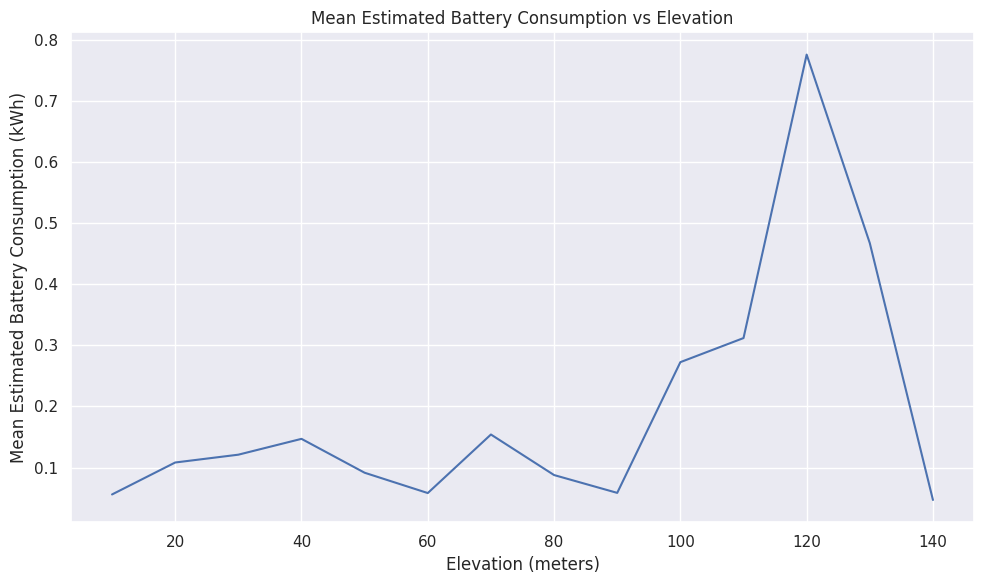

In [269]:
# Convert data to DataFrame for seaborn
calc = dataset[~dataset['stop']]
# Bin the distances every 100 meters
bins = range(int(min(calc['mean_elevation'])), int(max(calc['mean_elevation'])) + 10, 10)
calc['mean_elev_bin'] = pd.cut(calc['mean_elevation'], bins, right=False)

# Calculate mean consumption for each bin
binned_data = calc.groupby('mean_elev_bin')['est_battery_consumption(kwh)'].mean().reset_index()

# Extract bin labels for plotting
binned_data['mean_elev'] = binned_data['mean_elev_bin'].apply(lambda x: x.left + 10)  # Center of the bin



# Plotting
plt.figure(figsize=(10, 6))
sns.lineplot(data=binned_data, x='mean_elev', y='est_battery_consumption(kwh)')

plt.xlabel(f'Elevation (meters)')
plt.ylabel(f'Mean Estimated Battery Consumption (kWh)')
plt.title(f'Mean Estimated Battery Consumption vs Elevation')

# Tight layout for better spacing
plt.tight_layout()
plt.savefig(f'elevation.png', format='png')
plt.show()

In [175]:
dataset['duration'] = dataset.groupby(['vehicle', 'date'])['t'].apply(lambda x: x.shift(-1).sub(x).dt.total_seconds()).reset_index()['t']
dataset['duration'] = dataset['duration'].fillna(0.0)
max_durations = dataset.groupby(['vehicle', 'date', 't'])['duration'].transform('max')
dataset['duration'] = dataset['duration'].mask(dataset['duration'] == 0, max_durations)

#### Convert all object to category except the identifiers

In [176]:
def get_category_and_mapping(dataset, columns):
    parent = {}
    
    for column in columns:
        # Handle the date column separately to ensure it's sorted and contains only dates
        if column == 'date':
            dataset[column] = pd.to_datetime(dataset[column]).dt.date
            sorted_dates = sorted(dataset[column].unique())
            dataset[column] = pd.Categorical(dataset[column], categories=sorted_dates, ordered=True)
        else:
            dataset[column] = dataset[column].astype('category')
        
        # Create the mapping
        category_mapping = dict(enumerate(dataset[column].cat.categories))
        parent[column] = category_mapping
        # Assign category codes
        dataset[column] = dataset[column].cat.codes
    
    return parent

# Example usage (assuming 'dataset' is already defined and contains the mentioned columns)
mapping = get_category_and_mapping(
    dataset, 
    ['vehicle', 'date', 'road_segment_id', 'rain_status', 'day_of_week', 'is_weekend', 'time_range']
)

#### Split the dataset

In [177]:
mapping['vehicle']

{0: 'E301',
 1: 'E302',
 2: 'E304',
 3: 'E305',
 4: 'E306',
 5: 'E307',
 6: 'E308',
 7: 'E309',
 8: 'E310',
 9: 'E311',
 10: 'E312',
 11: 'E313',
 12: 'E314',
 13: 'E315',
 14: 'E316'}

In [113]:
dataset.describe()

,vehicle,t,road_segment_id,est_battery_consumption(kwh),date,segment_length,distance_traveled,temperature_2m,relative_humidity_2m,precipitation,...,wind_direction_10m,is_day,mean_elevation,avg_grade,avg_angle,rain_status,day_of_week,is_weekend,time_range,duration
count,264998.0,264998,264998.0,2.6e+05,264998.0,264998.0,264998.0,264998.0,264998.0,264998.0,...,264998.0,264998.0,264998.0,264998.0,264998.0,264998.0,264998.0,264998.0,264998.0,264998.0
mean,7.5,2024-01-30 09:16:16.287628288,439.0,1.0e-01,9.6,87.3,48.0,11.0,73.3,0.1,...,140.2,0.7,33.0,-0.5,-0.3,1.7,3.2,0.2,12.4,67.4
min,0.0,2024-01-20 04:08:44,0.0,0.0e+00,0.0,0.8,-74.6,3.4,22.0,0.0,...,4.8,0.0,0.9,-94.1,-41.9,0.0,0.0,0.0,4.0,0.0
25%,4.0,2024-01-25 05:29:17,180.0,9.9e-03,5.0,14.8,12.7,9.7,63.1,0.0,...,70.6,0.0,8.8,-2.7,-1.5,2.0,1.0,0.0,9.0,31.0
50%,7.0,2024-01-30 13:32:29,479.0,3.2e-02,10.0,42.4,27.0,11.4,79.3,0.0,...,139.6,1.0,25.7,-0.3,-0.2,2.0,4.0,0.0,12.0,31.0
75%,11.0,2024-02-03 19:30:02,664.0,9.8e-02,14.0,100.5,63.0,12.5,87.9,0.0,...,183.4,1.0,51.6,1.7,0.9,2.0,5.0,0.0,16.0,62.0
max,14.0,2024-02-09 21:01:03,873.0,5.0e+00,19.0,1056.0,808.0,15.7,100.0,3.7,...,360.0,1.0,135.5,40.9,21.0,2.0,6.0,1.0,22.0,28036.0
std,4.2,NaN,255.0,2.1e-01,5.8,121.3,53.3,2.3,18.9,0.5,...,86.6,0.5,25.0,7.4,4.0,0.7,2.1,0.4,4.4,219.0


In [114]:
def split_dataset(dataset):
    X = dataset.drop(columns=['trip_id', 'geometry'])

    split = math.floor(0.7 * X['date'].max())
    X_train, X_test = X[X['date'] <= split], X[X['date'] > split]
    
    X_train_cleaned, train_stopping_points = X_train[~X_train['stop']].copy(), X_train[X_train['stop']].copy()
    X_test_cleaned, test_stopping_points = X_test[~X_test['stop']].copy(), X_test[X_test['stop']].copy()
    
    y_train_cleaned, y_test_cleaned = X_train_cleaned['est_battery_consumption(kwh)'].values, X_test_cleaned['est_battery_consumption(kwh)'].values
    
    # Drop the values from X
    X_train_cleaned = X_train_cleaned.drop(columns=['est_battery_consumption(kwh)']).values
    X_test_cleaned = X_test_cleaned.drop(columns=['est_battery_consumption(kwh)']).values
    
    # Wrap the stopping points
    stopping_points = {
        'train': train_stopping_points,
        'test': test_stopping_points,
    }

    return X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned, stopping_points

In [178]:
def split_dataset(dataset):
    # Create a copy of the dataset to avoid modifying the original
    df = dataset.copy()
    stopping_points = df[df['stop']]
    
    df = df[~df['stop']]
    

    # Separate features and target
    y = df['est_battery_consumption(kwh)']
    X = df.drop(columns=['est_battery_consumption(kwh)', 'geometry'])
    
    # Create a GroupShuffleSplit object
    splitter = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
    
    # Split the data into train and test
    train_idx, test_idx = next(splitter.split(X, groups=X['unique_trip_id']))
    
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
    
#     # Separate stopping points
#     train_stopping_points = X_train[X_train['stop']].copy()
#     test_stopping_points = X_test[X_test['stop']].copy()
    
#     # Remove stopping points from main datasets
#     X_train_cleaned = X_train[~X_train['stop']].copy()
#     X_test_cleaned = X_test[~X_test['stop']].copy()
#     y_train_cleaned = y_train[~X_train['stop']].copy()
#     y_test_cleaned = y_test[~X_test['stop']].copy()
    
    # Drop unnecessary columns and convert to numpy arrays
    X_train_cleaned = X_train.values
    X_test_cleaned = X_test.values
    
    y_train_cleaned = y_train.values
    y_test_cleaned = y_test.values

    return X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned, stopping_points

In [179]:
X_train, y_train, X_test, y_test, stopping_points = split_dataset(dataset)

In [180]:
print('Dataset shape: {}'.format(dataset.shape))
print('X train shape: {}'.format(X_train.shape))
print('y train shape: {}'.format(y_train.shape))
print('X test shape: {}'.format(X_test.shape))
print('y test shape: {}'.format(y_test.shape))

Dataset shape: (264998, 24)
X train shape: (172028, 22)
y train shape: (172028,)
X test shape: (75281, 22)
y test shape: (75281,)


In [181]:
for key, val in stopping_points.items():
    print('Dataset {} shape: {}'.format(key, val.shape))

Dataset vehicle shape: (17689,)
Dataset t shape: (17689,)
Dataset road_segment_id shape: (17689,)
Dataset est_battery_consumption(kwh) shape: (17689,)
Dataset date shape: (17689,)
Dataset segment_length shape: (17689,)
Dataset distance_traveled shape: (17689,)
Dataset temperature_2m shape: (17689,)
Dataset relative_humidity_2m shape: (17689,)
Dataset precipitation shape: (17689,)
Dataset wind_speed_10m shape: (17689,)
Dataset wind_direction_10m shape: (17689,)
Dataset is_day shape: (17689,)
Dataset mean_elevation shape: (17689,)
Dataset avg_grade shape: (17689,)
Dataset avg_angle shape: (17689,)
Dataset geometry shape: (17689,)
Dataset stop shape: (17689,)
Dataset unique_trip_id shape: (17689,)
Dataset rain_status shape: (17689,)
Dataset day_of_week shape: (17689,)
Dataset is_weekend shape: (17689,)
Dataset time_range shape: (17689,)
Dataset duration shape: (17689,)


### Feature Extraction and Selection

In [182]:
columns = dataset.drop(columns=['est_battery_consumption(kwh)', 'geometry']).columns.values.tolist()
columns

['vehicle',
 't',
 'road_segment_id',
 'date',
 'segment_length',
 'distance_traveled',
 'temperature_2m',
 'relative_humidity_2m',
 'precipitation',
 'wind_speed_10m',
 'wind_direction_10m',
 'is_day',
 'mean_elevation',
 'avg_grade',
 'avg_angle',
 'stop',
 'unique_trip_id',
 'rain_status',
 'day_of_week',
 'is_weekend',
 'time_range',
 'duration']

In [183]:
# Creating a dataframe from the train set for easily identifying correlations
train_df = pd.DataFrame(X_train, columns = columns)

train_df['est_battery_consumption(kwh)'] = y_train
train_df = train_df.reset_index(drop=True)

In [184]:
# Creating a dataframe from the test set for our convinence
test_df = pd.DataFrame(X_test, columns = columns)

test_df['est_battery_consumption(kwh)'] = y_test
test_df = test_df.reset_index(drop=True)

In [185]:
print(train_df.shape, test_df.shape)

(172028, 23) (75281, 23)


#### Get correlation

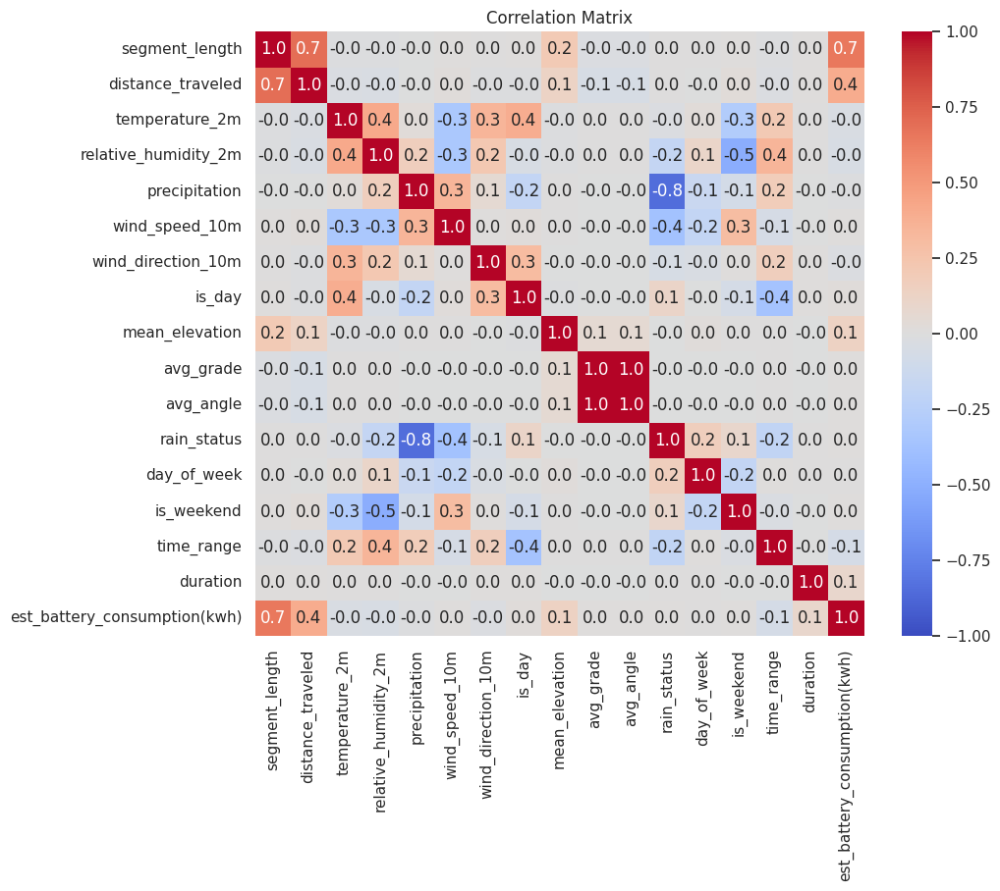

In [413]:
corr_matrix = train_df.loc[ : ,(~train_df.columns.isin(['t', 'vehicle', 'date', 'road_segment_id', 'stop']))].corr()

# Plot the correlation matrix using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".1f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.savefig('correlatio_after.png', format='png')
plt.show()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

selected_columns = train_df.loc[:, ~train_df.columns.isin(['t', 'vehicle', 'date', 'road_segment_id', 'stop'])].columns

# Create a new DataFrame with only the selected columns
X_train_selected = train_df[selected_columns]

# Calculate VIF for each selected feature
vif_data = pd.DataFrame()
vif_data["feature"] = selected_columns
vif_data["VIF"] = [variance_inflation_factor(X_train_selected.values, i) for i in range(X_train_selected.shape[1])]
vif_data

### Feature Importance

In [123]:
from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot

# define dataset
model = RandomForestRegressor()

X_train = train_df.loc[ : ,(~train_df.columns.isin(['t', 'vehicle', 'date', 'road_segment_id', 'stop', 'est_battery_consumption(kwh)', 'unique_trip_id']))].values
y_train = train_df['est_battery_consumption(kwh)'].values

model.fit(X_train, y_train.ravel())

RandomForestRegressor()

In [124]:
columns = train_df.columns[~train_df.columns.isin(['t', 'vehicle', 'date', 'stop', 'road_segment_id', 'est_battery_consumption(kwh)', 'unique_trip_id'])]

In [125]:
columns

Index(['segment_length', 'distance_traveled', 'temperature_2m',
       'relative_humidity_2m', 'precipitation', 'wind_speed_10m',
       'wind_direction_10m', 'is_day', 'mean_elevation', 'avg_grade',
       'avg_angle', 'rain_status', 'day_of_week', 'is_weekend', 'time_range',
       'duration'],
      dtype='object')

In [126]:
model.feature_importances_

array([0.55042274, 0.07959741, 0.02563332, 0.02729448, 0.00327929,
       0.02493313, 0.02487985, 0.00187154, 0.11776166, 0.04182274,
       0.02381611, 0.00077409, 0.01053747, 0.00268639, 0.02213258,
       0.04255719])

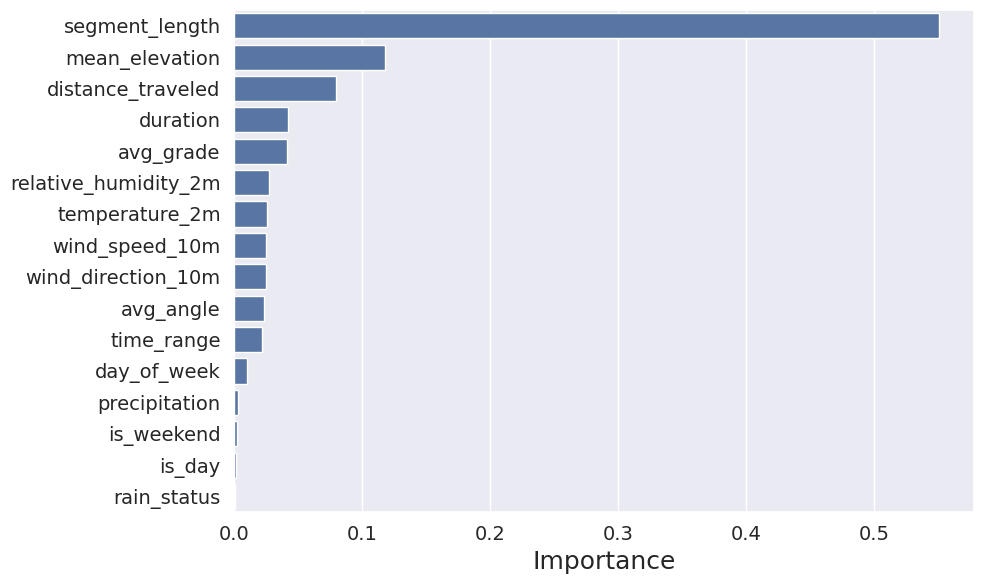

In [129]:
# Get feature importance
importance = model.feature_importances_

feature_imp = pd.DataFrame()
feature_imp['Feature'] = columns
feature_imp['Importance'] = importance

# Sort by importance
feature_imp = feature_imp.sort_values('Importance', ascending=False).reset_index(drop=True)


# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp)
plt.title('', fontsize=18)
plt.xlabel('Importance', fontsize=18)
plt.ylabel('', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()  # Ensure everything fits without overlap
plt.savefig('feature-importance.svg', format='svg')
plt.show()

#### Feature selection

In [130]:
good_features = feature_imp.Feature.head(10).values.tolist()
good_features.append('est_battery_consumption(kwh)')
good_features.extend(['date', 't', 'vehicle', 'road_segment_id', 'time_range', 'unique_trip_id'])
good_features

['segment_length',
 'mean_elevation',
 'distance_traveled',
 'duration',
 'avg_grade',
 'relative_humidity_2m',
 'temperature_2m',
 'wind_speed_10m',
 'wind_direction_10m',
 'avg_angle',
 'est_battery_consumption(kwh)',
 'date',
 't',
 'vehicle',
 'road_segment_id',
 'time_range',
 'unique_trip_id']

In [186]:
good_features = ['segment_length',
 'mean_elevation',
 'distance_traveled',
 'duration',
 'relative_humidity_2m',
 'temperature_2m',
 'wind_speed_10m',
 'wind_direction_10m',
 'time_range',
 'avg_grade',
 'est_battery_consumption(kwh)',
 'date', 't', 'vehicle', 'road_segment_id', 'unique_trip_id']

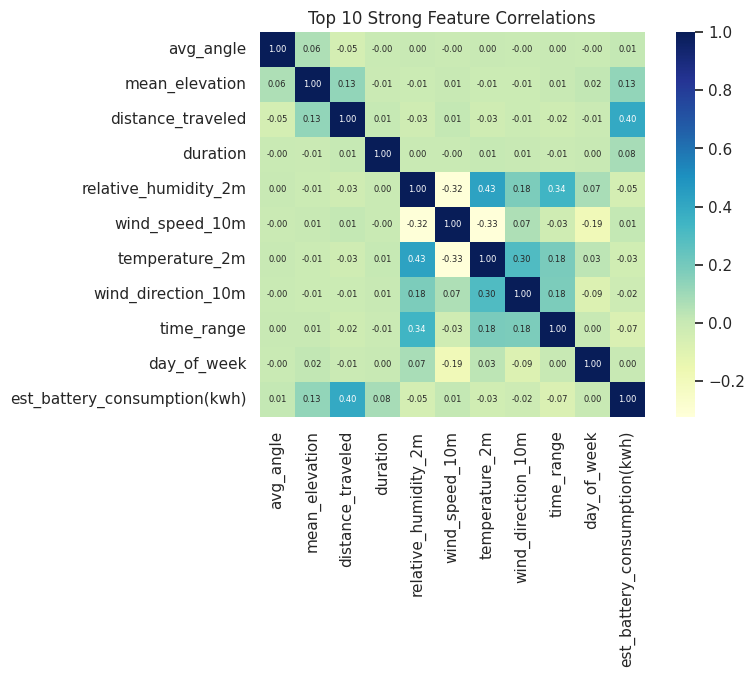

In [60]:
# now we can inspect the correlations for only the strong features
sns.heatmap(train_df[good_features].corr(), annot = True, annot_kws = {'size': 6}, square = True, cmap = 'YlGnBu', fmt = '.2f').set(title = 'Top 10 Strong Feature Correlations')
plt.savefig('corr-good-feature.png', format='png')
plt.show()

In [187]:
train_df = train_df[good_features]

In [188]:
test_df = test_df[good_features]

In [189]:
train_df['is_train'] = True
test_df['is_train'] = False

#### One hot encode categorical features

In [190]:
from sklearn.preprocessing import OneHotEncoder

features = good_features.copy()
features.append('is_train')
# Create an instance of One-hot-encoder
enc = OneHotEncoder()

df = pd.concat([train_df, test_df])

# Passing encoded columns
enc_data = pd.DataFrame(enc.fit_transform(df[['time_range']]).toarray())

# Merge with main
df = df.join(enc_data)

# Dropping the original and newly created categorical variable
df.drop('time_range', axis=1, inplace=True)

# Rename columns
features.pop(features.index('time_range'))
df.columns = features + [f'time_range_{i}' for i in range(len(enc_data.columns))]

df.head()

,segment_length,mean_elevation,distance_traveled,duration,relative_humidity_2m,temperature_2m,wind_speed_10m,wind_direction_10m,avg_grade,est_battery_consumption(kwh),...,time_range_9,time_range_10,time_range_11,time_range_12,time_range_13,time_range_14,time_range_15,time_range_16,time_range_17,time_range_18
0,14.4,8.7,1.6,30.0,29.6,4.7,10.5,15.9,-1.3,1.0e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,63.8,8.5,43.1,30.0,29.6,4.7,10.5,15.9,-0.2,2.0e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,48.9,8.4,49.0,30.0,29.6,4.7,10.5,15.9,-0.4,2.3e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,13.9,8.1,14.0,30.0,29.6,4.7,10.5,15.9,-1.7,6.5e-02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,74.4,7.6,54.9,31.0,29.6,4.7,10.5,15.9,-0.2,5.1e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [191]:
train_df = df[df['is_train'] == True]
test_df = df[df['is_train'] == False]

train_df = train_df.drop(columns=['is_train'])
test_df = test_df.drop(columns=['is_train'])

#### Scale data

In [192]:
features = good_features.copy()
for column in ['t', 'vehicle', 'time_range', 'date', 'est_battery_consumption(kwh)', 'road_segment_id', 'unique_trip_id']:
    features.pop(features.index(column))
features

['segment_length',
 'mean_elevation',
 'distance_traveled',
 'duration',
 'relative_humidity_2m',
 'temperature_2m',
 'wind_speed_10m',
 'wind_direction_10m',
 'avg_grade']

In [193]:
std = StandardScaler().fit(train_df[features])
train_df[features] = std.transform(train_df[features])
test_df[features] = std.transform(test_df[features])

In [194]:
train_df.head()

,segment_length,mean_elevation,distance_traveled,duration,relative_humidity_2m,temperature_2m,wind_speed_10m,wind_direction_10m,avg_grade,est_battery_consumption(kwh),...,time_range_9,time_range_10,time_range_11,time_range_12,time_range_13,time_range_14,time_range_15,time_range_16,time_range_17,time_range_18
0,-0.6,-1.0,-8.9e-01,-0.1,-2.3,-2.8,0.3,-1.4,-1.0e-01,1.0e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.2,-1.0,-1.2e-01,-0.1,-2.3,-2.8,0.3,-1.4,5.2e-02,2.0e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.3,-1.0,-8.3e-03,-0.1,-2.3,-2.8,0.3,-1.4,2.1e-02,2.3e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.6,-1.0,-6.6e-01,-0.1,-2.3,-2.8,0.3,-1.4,-1.5e-01,6.5e-02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.1,-1.0,1.0e-01,-0.1,-2.3,-2.8,0.3,-1.4,5.1e-02,5.1e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [195]:
test_df.head()

,segment_length,mean_elevation,distance_traveled,duration,relative_humidity_2m,temperature_2m,wind_speed_10m,wind_direction_10m,avg_grade,est_battery_consumption(kwh),...,time_range_9,time_range_10,time_range_11,time_range_12,time_range_13,time_range_14,time_range_15,time_range_16,time_range_17,time_range_18
0,-0.6,2.3,-0.7,-0.1,-1.9,-1.4,6.4e-03,-1.6,3.5,4.5e-02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7.1,2.4,0.7,-0.1,-1.9,-1.4,6.4e-03,-1.6,0.4,1.4e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.1,2.1,-0.8,-0.1,-1.9,-1.4,6.4e-03,-1.6,0.6,9.5e-02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.6,2.5,-0.6,-0.1,-1.9,-1.4,6.4e-03,-1.6,1.5,2.3e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2.1,2.8,1.7,0.7,-1.9,-1.4,6.4e-03,-1.6,0.9,3.4e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Fit the model

#### Preparing the data

In [196]:
time_ranges = [f'time_range_{i}' for i in range(19)]
X_train = train_df.loc[:,(train_df.columns.isin(features+time_ranges))].values
y_train = train_df['est_battery_consumption(kwh)'].values

In [197]:
X_train[0].shape

(28,)

In [198]:
X_test = []
y_test = []
names = []
time_ranges = [f'time_range_{i}' for i in range(19)]
for name, group in test_df.groupby(['unique_trip_id']):
    name += (group['t'].min(), group['t'].max(), )
    names.append(name)
    X_test.append(group.loc[:,(test_df.columns.isin(features+time_ranges))].values)
    y_test.append(group['est_battery_consumption(kwh)'].values)
    
print(len(names), len(X_test), len(y_test))

1100 1100 1100


In [199]:
X_test

[array([[ 7.10765558e+00,  2.44786569e+00,  1.92807480e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-6.28903829e-01,  2.25939365e+00, -8.81363348e-01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.32850065e-01,  2.08447408e+00,  9.00844548e-01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [ 4.21231431e-01, -6.83776976e-02,  1.71285399e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.72757227e+00,  6.46102706e-03,  1.32684445e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.08532722e+00, -1.89079502e-01,  3.01246230e-01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]),
 array([[-0.65145541, -0.57607606, -0.73003073,  0.02769571, -1.55993707,
         -0.40078413, -0.80638016,  2.02255564,  0.07596959,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       

#### Fit linear regression model (Combined)

In [200]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X_train, y_train)
reg.score(X_train, y_train)

0.44993747408733975

#### K fold cross validation

In [201]:
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(reg, X_train, y_train, scoring='r2', cv=folds)
scores

array([0.44486817, 0.45532251, 0.44870755, 0.45172054, 0.4463377 ])

In [202]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'n_features_to_select': list(range(1, 29))}]


# step-3: perform grid search
# 3.1 specify model
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)             

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24, 25, 26, 27, 28]}],
             return_train_score=True, scoring='r2', verbose=1)

In [158]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.2,3.5e-02,1.0e-03,8.6e-05,1,{'n_features_to_select': 1},-2.7e-05,7.7e-05,-4.2e-05,2.7e-04,...,5.3e-05,1.2e-04,28,9.2e-05,6.8e-05,9.9e-05,1.9e-05,9.3e-05,7.4e-05,2.9e-05
1,1.2,2.3e-02,1.4e-03,1.0e-04,2,{'n_features_to_select': 2},4.2e-01,4.4e-01,4.4e-01,4.2e-01,...,4.3e-01,5.6e-03,27,4.3e-01,4.3e-01,4.3e-01,4.3e-01,4.3e-01,4.3e-01,1.4e-03
2,1.1,4.1e-02,1.5e-03,6.6e-05,3,{'n_features_to_select': 3},4.2e-01,4.4e-01,4.4e-01,4.2e-01,...,4.3e-01,5.6e-03,26,4.3e-01,4.3e-01,4.3e-01,4.3e-01,4.3e-01,4.3e-01,1.4e-03
3,1.2,2.9e-02,1.5e-03,1.1e-04,4,{'n_features_to_select': 4},4.3e-01,4.4e-01,4.4e-01,4.3e-01,...,4.4e-01,4.6e-03,25,4.4e-01,4.3e-01,4.4e-01,4.4e-01,4.4e-01,4.4e-01,3.9e-03
4,1.1,3.5e-02,1.8e-03,3.2e-04,5,{'n_features_to_select': 5},4.3e-01,4.5e-01,4.4e-01,4.3e-01,...,4.4e-01,5.8e-03,24,4.4e-01,4.4e-01,4.5e-01,4.4e-01,4.4e-01,4.4e-01,3.1e-03
5,1.1,2.3e-02,2.7e-03,1.3e-03,6,{'n_features_to_select': 6},4.3e-01,4.5e-01,4.4e-01,4.3e-01,...,4.4e-01,7.3e-03,23,4.4e-01,4.4e-01,4.5e-01,4.4e-01,4.4e-01,4.4e-01,2.8e-03
6,1.1,3.6e-02,2.1e-03,6.1e-04,7,{'n_features_to_select': 7},4.3e-01,4.5e-01,4.5e-01,4.3e-01,...,4.4e-01,7.3e-03,22,4.4e-01,4.4e-01,4.5e-01,4.4e-01,4.4e-01,4.4e-01,2.8e-03
7,1.1,3.2e-02,1.8e-03,8.8e-05,8,{'n_features_to_select': 8},4.3e-01,4.5e-01,4.5e-01,4.3e-01,...,4.4e-01,7.2e-03,21,4.4e-01,4.5e-01,4.5e-01,4.4e-01,4.4e-01,4.4e-01,2.7e-03
8,1.0,3.5e-02,5.7e-03,3.6e-03,9,{'n_features_to_select': 9},4.3e-01,4.5e-01,4.5e-01,4.3e-01,...,4.4e-01,7.3e-03,20,4.4e-01,4.5e-01,4.5e-01,4.4e-01,4.4e-01,4.4e-01,2.7e-03
9,1.0,3.2e-02,2.0e-03,1.1e-04,10,{'n_features_to_select': 10},4.3e-01,4.5e-01,4.5e-01,4.3e-01,...,4.4e-01,7.4e-03,19,4.4e-01,4.5e-01,4.5e-01,4.4e-01,4.4e-01,4.4e-01,2.7e-03


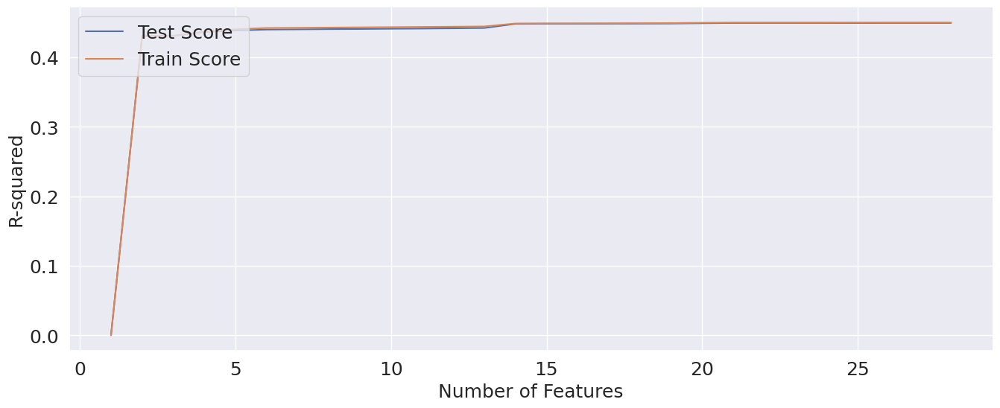

In [159]:
# plotting cv results
plt.figure(figsize=(16, 6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('Number of Features', fontsize=18)
plt.ylabel('R-squared', fontsize=18)
plt.title("", fontsize=18)
plt.legend(['Test Score', 'Train Score'], loc='upper left', fontsize=18)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.savefig('optimum_features.png', format='png')
plt.show()

In [219]:
n_features_optimal = 22

lm = LinearRegression()
lm.fit(X_train, y_train)

reg = RFE(lm, n_features_to_select=n_features_optimal)             
reg = reg.fit(X_train, y_train)
reg.score(X_train, y_train)

0.4498719598130033

#### Predicting the test data

In [220]:
res = {'vehicle': [], 'date': [], 'mse': [], 'rmse': [], 'mape': [], 'y_pred':[], 'y': [], 'times': [], 'weathers': [], 'trip_id': []}

for name, X, y in zip(names, X_test, y_test):

    y_pred = reg.predict(X)
    trip, start, end = name

    vehicle, date, _ , _ = trip.split("_")
    date = pd.to_datetime(date).date()

    mask_id = (consumption_df['vehicle'] == vehicle) & (consumption_df['date'] == date)
    mask_trip = (consumption_df['t'] >= start) & (consumption_df['t'] <= end)

    consumption = consumption_df[(mask_id) & (mask_trip)].sort_values('t')
    test_data = dataset[dataset['unique_trip_id'] == trip]

    y = [consumption['value'].iloc[-1] - consumption['value'].iloc[0]]
    y_pred = [sum(y_pred)]

    res['vehicle'].append(vehicle)
    res['date'].append(date)
    res['trip_id'].append(trip)

    res['times'].append(consumption['t'].values)
    res['weathers'].append(test_data['precipitation'].values)

    res['y_pred'].append(y_pred[0])
    res['y'].append(y[0])

    res['mse'].append(metrics.mean_squared_error(y, y_pred))
    res['rmse'].append(math.sqrt(metrics.mean_squared_error(y, y_pred)))
    res['mape'].append(metrics.mean_absolute_percentage_error(y, y_pred))



res_df = pd.DataFrame(res)
res_df.to_csv('./regression_results_trip.csv', index=False)
res_df

,vehicle,date,mse,rmse,mape,y_pred,y,times,weathers,trip_id
0,E301,2024-01-21,8.2e-02,0.3,2.6e-02,10.7,11.0,"[2024-01-21T11:07:30.000000000, 2024-01-21T11:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-21_trip_118
1,E301,2024-01-21,5.4e+00,2.3,4.6e-01,2.7,5.0,"[2024-01-21T15:15:36.000000000, 2024-01-21T15:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-21_trip_226
2,E301,2024-01-21,6.8e+00,2.6,3.2e-01,10.6,8.0,"[2024-01-21T09:40:21.000000000, 2024-01-21T09:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-21_trip_62
3,E301,2024-01-23,3.1e+00,1.8,2.5e-01,5.2,7.0,"[2024-01-23T07:33:55.000000000, 2024-01-23T07:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-23_trip_157
4,E301,2024-01-23,5.8e+00,2.4,3.0e-01,5.6,8.0,"[2024-01-23T09:22:03.000000000, 2024-01-23T09:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-23_trip_210
...,...,...,...,...,...,...,...,...,...,...
1095,E316,2024-02-09,3.6e+00,1.9,2.4e-01,6.1,8.0,"[2024-02-09T16:41:34.000000000, 2024-02-09T16:...","[2.2, 2.2, 2.2, 2.2, 2.2, 2.2, 2.2, 2.2, 2.2, ...",E316_2024-02-09_trip_373
1096,E316,2024-02-09,8.3e-01,0.9,4.1e+15,0.9,0.0,"[2024-02-09T17:59:00.000000000, 2024-02-09T17:...","[3.1, 3.1, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5]",E316_2024-02-09_trip_425
1097,E316,2024-02-09,5.2e+00,2.3,3.3e-01,4.7,7.0,"[2024-02-09T18:11:47.000000000, 2024-02-09T18:...","[1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, ...",E316_2024-02-09_trip_438
1098,E316,2024-02-09,1.1e+01,3.3,2.8e-01,15.3,12.0,"[2024-02-09T19:51:57.000000000, 2024-02-09T19:...","[2.1, 2.1, 2.1, 2.1, 2.1, 2.1, 2.1, 2.1, 2.1, ...",E316_2024-02-09_trip_490


In [171]:
metrics_date = {'date': [], 'mse': [], 'rmse': [], 'mae': [], 'mape': [], 'variance': [], 'r2': [], 'std': []}
for name, group in res_df.groupby('vehicle'):
    y_pred = group['y_pred'].values
    y = group['y'].values
    
    mse = metrics.mean_squared_error(y, y_pred)
    rmse = np.sqrt(mse)
    mae = metrics.mean_absolute_error(y, y_pred)
    mape = metrics.mean_absolute_percentage_error(y, y_pred)
    variance = np.var(y_pred)
    r2 = metrics.r2_score(y, y_pred)
    std = np.std(y_pred)
    
    metrics_date['date'].append(name)
    metrics_date['mse'].append(mse)
    metrics_date['rmse'].append(rmse)
    metrics_date['mae'].append(mae)
    metrics_date['mape'].append(mape)
    metrics_date['variance'].append(variance)
    metrics_date['r2'].append(r2)
    metrics_date['std'].append(std)

# Converting the dictionary to a DataFrame
metrics_df = pd.DataFrame(metrics_date)
metrics_df

,date,mse,rmse,mae,mape,variance,r2,std
0,E301,6.7,2.6,1.8,2.3e-01,22.6,5.9e-01,4.8
1,E302,4.9,2.2,1.8,5.1e+13,7.6,4.0e-01,2.8
2,E304,4.8,2.2,1.7,2.9e-01,5.7,3.2e-01,2.4
3,E305,4.6,2.1,1.8,3.8e-01,5.6,2.4e-01,2.4
4,E306,4.2,2.0,1.5,4.0e+13,5.3,3.7e-01,2.3
5,E307,7.1,2.7,1.8,2.9e-01,7.4,4.0e-01,2.7
6,E308,5.6,2.4,1.9,3.1e-01,7.0,5.1e-01,2.6
7,E309,3.5,1.9,1.5,1.5e+13,4.2,2.6e-01,2.1
8,E310,3.5,1.9,1.4,2.4e-01,9.1,6.6e-01,3.0
9,E311,4.6,2.1,1.7,3.0e-01,7.9,6.4e-01,2.8


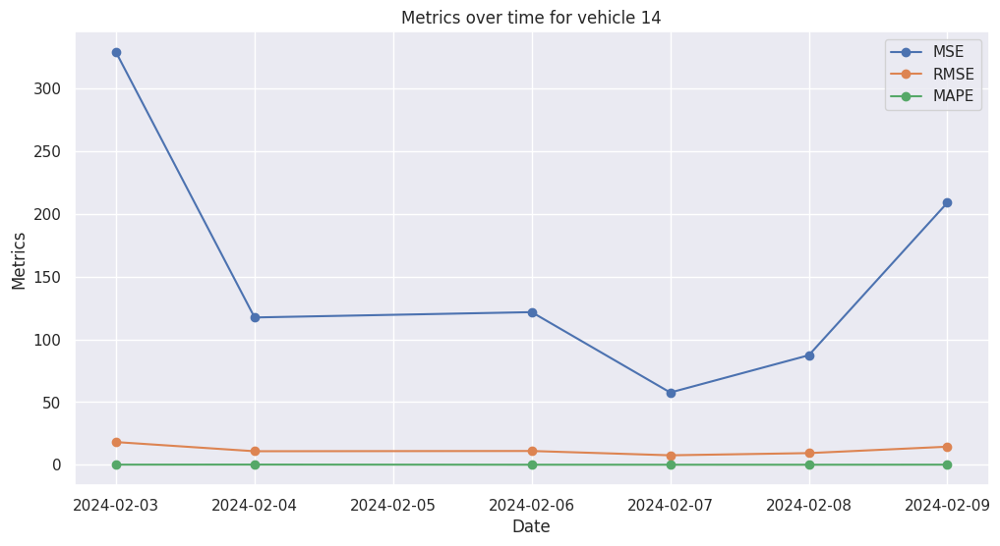

In [215]:
plt.figure(figsize=(12, 6))
plt.plot(metrics_df['date'], metrics_df['mse'], label='MSE', marker='o')
plt.plot(metrics_df['date'], metrics_df['rmse'], label='RMSE', marker='o')
plt.plot(metrics_df['date'], metrics_df['mape'], label='MAPE', marker='o')
plt.xlabel('Date')
plt.ylabel('Metrics')
plt.title(f'Metrics over time for vehicle {vehicle}')
plt.legend()
plt.grid(True)
plt.show()

### Visualize Result

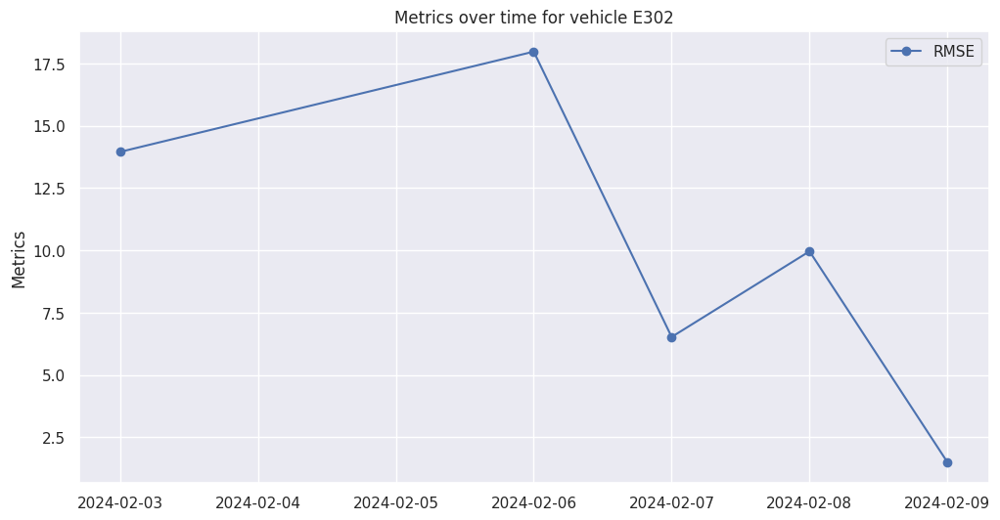

In [217]:
def visualize_by_vehicle(df, vehicle):
    df = df[df['vehicle'] == vehicle]

    plt.figure(figsize=(12, 6))
    plt.plot(df['date'], df['rmse'], label='RMSE', marker='o')
    plt.ylabel('Metrics')
    plt.title(f'Metrics over time for vehicle {vehicle}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
visualize_by_vehicle(res_df, 'E302')

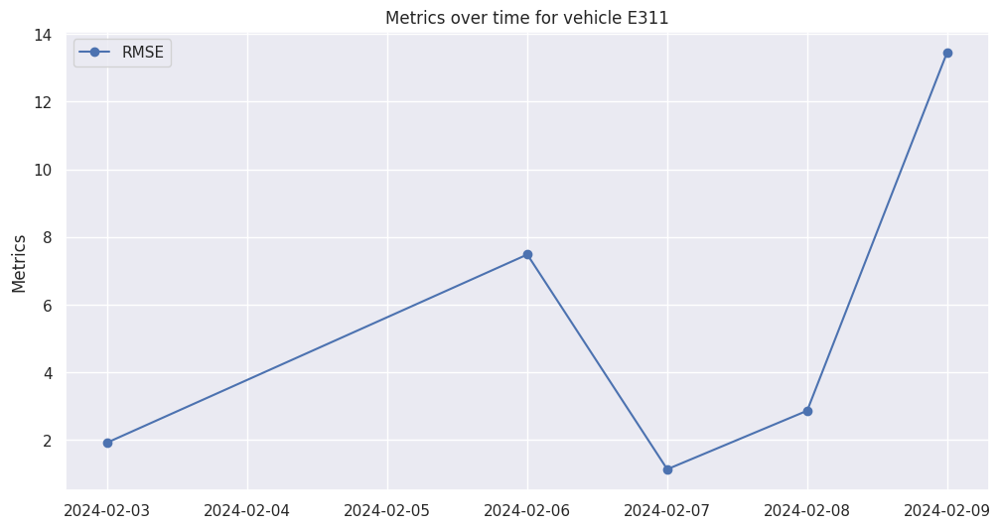

In [218]:
visualize_by_vehicle(res_df, 'E311')

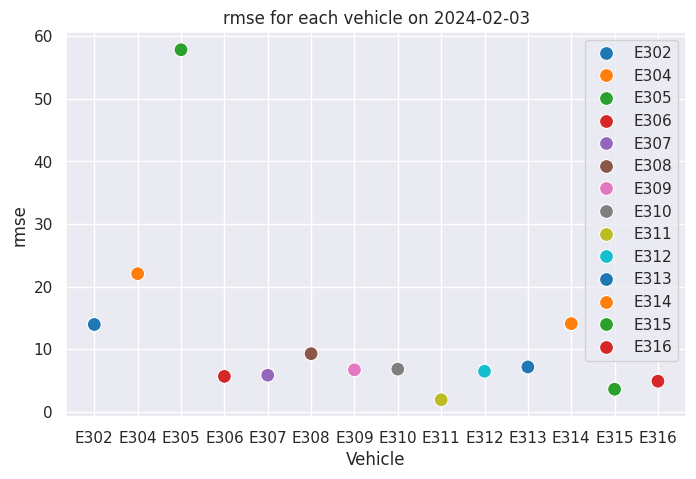

In [219]:
def visualize_by_date(df, date=None, metric=None):
    if date:
        df = df[df['date'] == date]
    sns.scatterplot(data=df, x='vehicle', y=metric, hue='vehicle', palette='tab10', s=100)
    plt.xlabel('Vehicle')
    plt.ylabel(metric)
    plt.title(f'{metric} for each vehicle on {date}')
    plt.grid(True)
    plt.legend()
    plt.show()
    
visualize_by_date(res_df, pd.to_datetime('2024-02-03').date(), 'rmse')

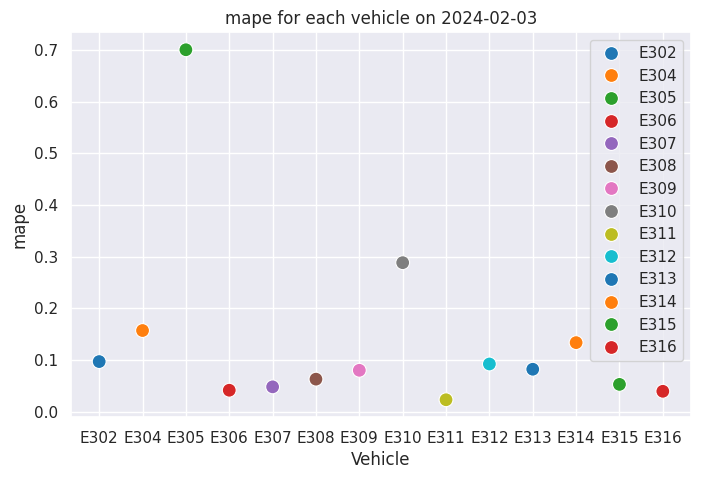

In [220]:
visualize_by_date(res_df, pd.to_datetime('2024-02-03').date(), 'mape')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


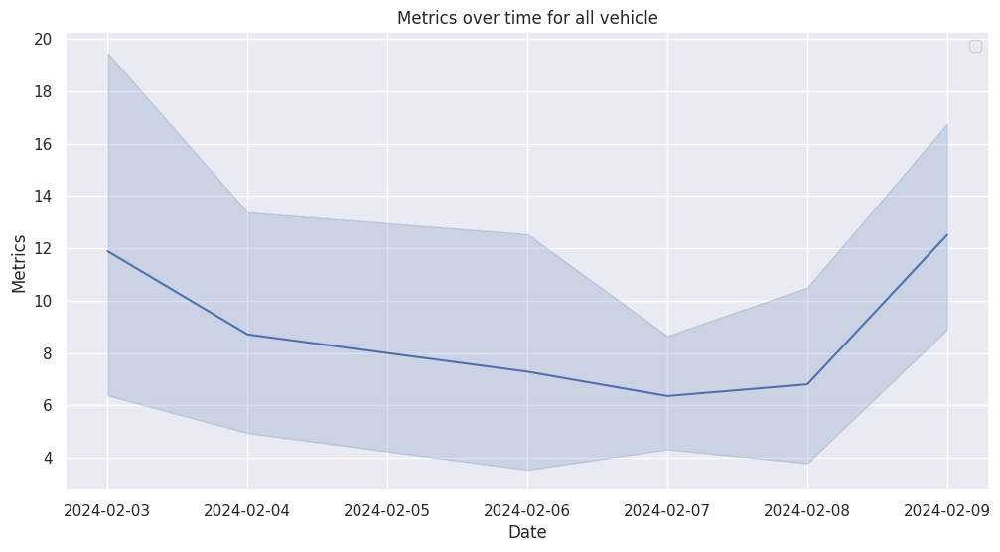

In [223]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=res_df, x='date', y='rmse')
plt.xlabel('Date')
plt.ylabel('Metrics')
plt.title(f'Metrics over time for all vehicle')
plt.legend()
plt.grid(True)
plt.savefig('rmse-all', format='png')
plt.show()

#### Fit regression per vehicle (16 models)

In [221]:
X_trains = []
y_trains = []
time_ranges = [f'time_range_{i}' for i in range(19)]
vehicles = train_df.vehicle.unique()
for vehicle in vehicles:
    vehicle_data = train_df[train_df['vehicle'] == vehicle]
    X_train = vehicle_data.loc[:,(train_df.columns.isin(features+time_ranges))].values
    y_train = vehicle_data['est_battery_consumption(kwh)'].values
    
    X_trains.append(X_train)
    y_trains.append(y_train)
print(features)

['segment_length', 'mean_elevation', 'distance_traveled', 'duration', 'relative_humidity_2m', 'temperature_2m', 'wind_speed_10m', 'wind_direction_10m', 'avg_grade']


In [222]:
X_test = []
y_test = []
names = []
time_ranges = [f'time_range_{i}' for i in range(19)]
for name, group in test_df.groupby(['vehicle', 'date', 'unique_trip_id']):
    name += (group['t'].min(), group['t'].max(), )
    names.append(name)
    X_test.append(group.loc[:,(test_df.columns.isin(features+time_ranges))].values)
    y_test.append(group['est_battery_consumption(kwh)'].values)
    
print(len(names), len(X_test), len(y_test))

1100 1100 1100


#### Fit model for each vehicle

In [223]:
models = []
for X_train, y_train in zip(X_trains, y_trains):
    # final model
    n_features_optimal = 22

    lm = LinearRegression()
    lm.fit(X_train, y_train)

    reg = RFE(lm, n_features_to_select=n_features_optimal)             
    reg = rfe.fit(X_train, y_train)
    reg.score(X_train, y_train)
    models.append(reg)

print(len(models))

15


In [176]:
### Create reverse mapping
vehicle_mapping = {}
for key, val in mapping['vehicle'].items():
    vehicle_mapping[val] = key

print(vehicle_mapping)

{'E301': 0, 'E302': 1, 'E304': 2, 'E305': 3, 'E306': 4, 'E307': 5, 'E308': 6, 'E309': 7, 'E310': 8, 'E311': 9, 'E312': 10, 'E313': 11, 'E314': 12, 'E315': 13, 'E316': 14}


In [224]:
res = {'vehicle': [], 'date': [], 'mse': [], 'rmse': [], 'mape': [], 'y_pred':[], 'y': [], 'times': [], 'weathers': [], 'trip_id': []}

for name, X, y in zip(names, X_test, y_test):
    vehicle_encoded, date_encoded, trip, start, end = name
    model = models[vehicle_encoded]

    vehicle, date, _ , _ = trip.split("_")
    date = pd.to_datetime(date).date()


    y_pred = model.predict(X)

    mask_id = (consumption_df['vehicle'] == vehicle) & (consumption_df['date'] == date)
    mask_trip = (consumption_df['t'] >= start) & (consumption_df['t'] <= end)

    consumption = consumption_df[(mask_id) & (mask_trip)].sort_values('t')
    test_data = dataset[dataset['unique_trip_id'] == trip]

    y = [consumption['value'].iloc[-1] - consumption['value'].iloc[0]]
    y_pred = [sum(y_pred)]

    res['vehicle'].append(vehicle)
    res['date'].append(date)
    res['trip_id'].append(trip)

    res['times'].append(consumption['t'].values)
    res['weathers'].append(test_data['precipitation'].values)

    res['y_pred'].append(y_pred[0])
    res['y'].append(y[0])

    res['mse'].append(metrics.mean_squared_error(y, y_pred))
    res['rmse'].append(math.sqrt(metrics.mean_squared_error(y, y_pred)))
    res['mape'].append(metrics.mean_absolute_percentage_error(y, y_pred))

    
res_df = pd.DataFrame(res)
res_df.to_csv('./regression__individual_results_trip.csv', index=False)
res_df

,vehicle,date,mse,rmse,mape,y_pred,y,times,weathers,trip_id
0,E301,2024-01-21,1.1,1.1,9.7e-02,9.9,11.0,"[2024-01-21T11:07:30.000000000, 2024-01-21T11:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-21_trip_118
1,E301,2024-01-21,5.4,2.3,4.6e-01,2.7,5.0,"[2024-01-21T15:15:36.000000000, 2024-01-21T15:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-21_trip_226
2,E301,2024-01-21,4.5,2.1,2.6e-01,10.1,8.0,"[2024-01-21T09:40:21.000000000, 2024-01-21T09:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-21_trip_62
3,E301,2024-01-23,1.6,1.3,1.8e-01,5.7,7.0,"[2024-01-23T07:33:55.000000000, 2024-01-23T07:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-23_trip_157
4,E301,2024-01-23,2.8,1.7,2.1e-01,6.3,8.0,"[2024-01-23T09:22:03.000000000, 2024-01-23T09:...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",E301_2024-01-23_trip_210
...,...,...,...,...,...,...,...,...,...,...
1095,E316,2024-02-09,4.2,2.0,2.6e-01,6.0,8.0,"[2024-02-09T16:41:34.000000000, 2024-02-09T16:...","[2.2, 2.2, 2.2, 2.2, 2.2, 2.2, 2.2, 2.2, 2.2, ...",E316_2024-02-09_trip_373
1096,E316,2024-02-09,0.7,0.9,3.9e+15,0.9,0.0,"[2024-02-09T17:59:00.000000000, 2024-02-09T17:...","[3.1, 3.1, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5]",E316_2024-02-09_trip_425
1097,E316,2024-02-09,7.0,2.7,3.8e-01,4.3,7.0,"[2024-02-09T18:11:47.000000000, 2024-02-09T18:...","[1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, ...",E316_2024-02-09_trip_438
1098,E316,2024-02-09,29.4,5.4,4.5e-01,17.4,12.0,"[2024-02-09T19:51:57.000000000, 2024-02-09T19:...","[2.1, 2.1, 2.1, 2.1, 2.1, 2.1, 2.1, 2.1, 2.1, ...",E316_2024-02-09_trip_490


In [185]:
metrics_date = {'vehicle': [], 'mse': [], 'rmse': [], 'mae': [], 'mape': [], 'variance': [], 'r2': [], 'std': []}
for name, group in res_df.groupby('vehicle'):
    y_pred = group['y_pred'].values
    y = group['y'].values
    
    mse = metrics.mean_squared_error(y, y_pred)
    rmse = np.sqrt(mse)
    mae = metrics.mean_absolute_error(y, y_pred)
    mape = metrics.mean_absolute_percentage_error(y, y_pred)
    variance = np.var(y_pred)
    r2 = metrics.r2_score(y, y_pred)
    std = np.std(y_pred)
    
    metrics_date['vehicle'].append(name)
    metrics_date['mse'].append(mse)
    metrics_date['rmse'].append(rmse)
    metrics_date['mae'].append(mae)
    metrics_date['mape'].append(mape)
    metrics_date['variance'].append(variance)
    metrics_date['r2'].append(r2)
    metrics_date['std'].append(std)

# Converting the dictionary to a DataFrame
metrics_df = pd.DataFrame(metrics_date)
metrics_df

,vehicle,mse,rmse,mae,mape,variance,r2,std
0,E301,7.5,2.7,1.8,2.2e-01,23.0,5.4e-01,4.8
1,E302,5.2,2.3,1.9,4.2e+13,8.0,3.7e-01,2.8
2,E304,5.2,2.3,1.8,3.1e-01,5.6,2.6e-01,2.4
3,E305,5.3,2.3,1.9,4.0e-01,5.8,1.3e-01,2.4
4,E306,4.4,2.1,1.7,4.4e+13,5.6,3.3e-01,2.4
5,E307,7.4,2.7,1.8,3.1e-01,6.3,3.8e-01,2.5
6,E308,6.0,2.4,1.9,3.3e-01,6.7,4.8e-01,2.6
7,E309,3.8,1.9,1.6,1.9e+13,3.8,2.0e-01,1.9
8,E310,3.5,1.9,1.5,2.5e-01,9.3,6.6e-01,3.1
9,E311,4.8,2.2,1.7,3.1e-01,7.6,6.2e-01,2.8


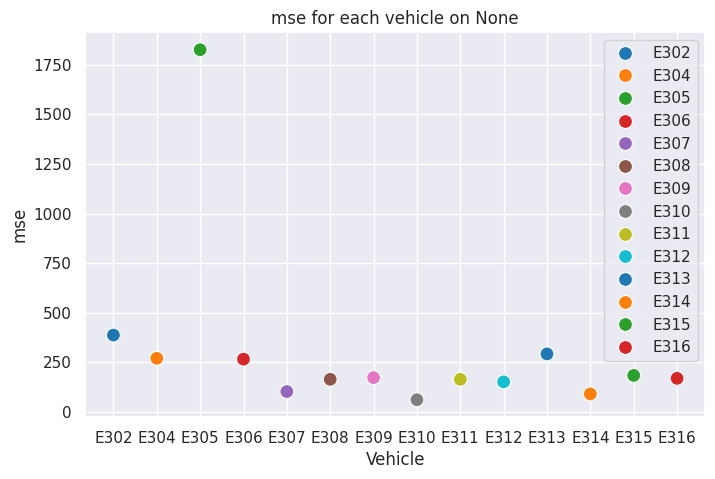

In [229]:
visualize_by_date(metrics_df, date=None, metric='mse')

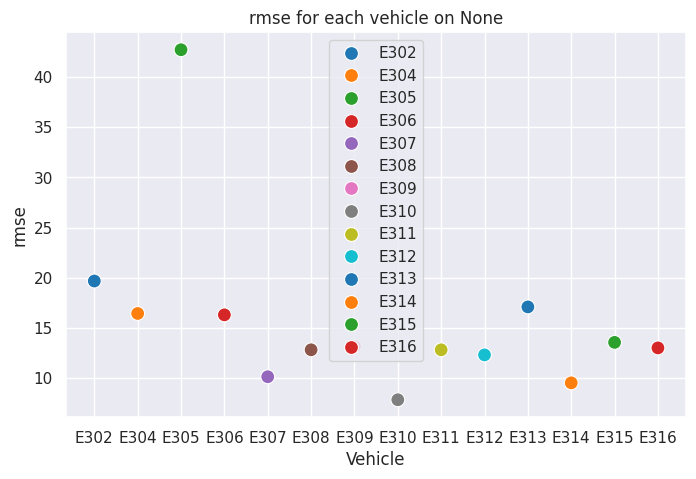

In [230]:
visualize_by_date(metrics_df, date=None, metric='rmse')

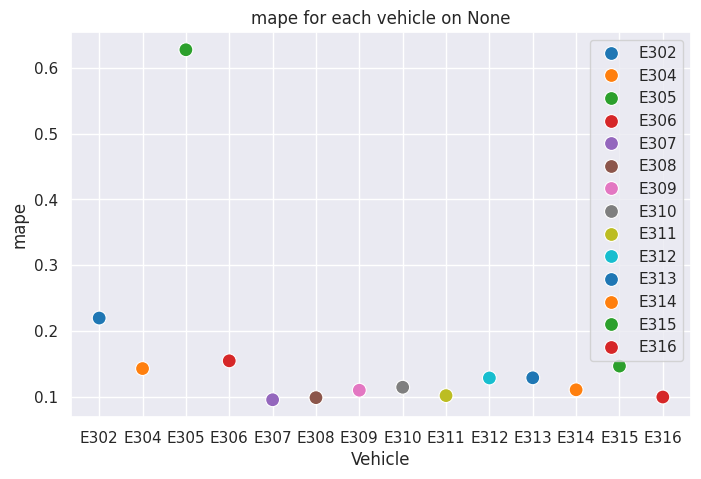

In [221]:
visualize_by_date(metrics_df, date=None, metric='mape')